<a href="https://colab.research.google.com/github/Zeilion/Covid_dashboard/blob/main/notebooks/datavis/Moustik_Cam_COCO_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<hr style="border-width:2px;border-color:#75DFC1">
<center><h1>DataVis et prototype de modèle de Détection d'objet - DataSet COCO</h1></center>
<hr style="border-width:2px;border-color:#75DFC1">

<center>V0.9.0b</center>


Pour pouvoir détecter si mon chat veut rentrer ou sortir de chez moi (et détecter également de potentiels intrus), je vais utiliser le DataSet COCO pour entraîner un modèle de détection multi-boxes inspiré de l'algorithme Yolo. Ce modèle sera, dans un premier temps, uniquement entraîné à distinguer des chats et des humains. Plus tard, j'essayerai de l'entraîner à faire la différence entre d'autres chats et le mien (Moustik).


## Notes de versions:

### TODO

- créer une métrique pour mesurer les performances du modèle (cf papier de YOLOv1 : utilisation de **mAP** ?)
- inclure l'**IoU** (Intersection Over Union) dans la fonction de perte.
- utiliser la **non-maximal suppression** pour éviter le chevauchement de bbox prédites, sur des cellules adjescentes, pour un même objet.
- augmentation : ajuster aléatoirement la saturation et l'exposition d'un facteur 1.5 dans l'espace de couleur HSV ? faire des zooms sur les images ? d'autres augmentations ?
- trouver une méthode d'explication visuelle afin de surligner les zones importantes lors de la prédiction par le modèle (comme le Grad-Cam), afin de s'assurer de la pertinence de ce dernier et détecter d'éventuels biais.

### V0.9.0b - test des corrections apportées au dataset initial

Le modèle ayant parfois un peu de mal à détecter des humains (et surtout des parties d'humains), le premier test consiste à enlever la limite corrigeant la disparité entre les deux classes. -> Pas bonne idée pour le moment, trop d'images, prend trop de temps, plus important à faire pour le moment.

### V0.8.0b - Entraînement avec Fine-Tuning

Après un premier entraînement avec gel des couches de la backbone, essais de Fine-Tuning avec différents Learning Rates.  
Meilleures Performances avec des `val_loss` aux alentours de 2. (2.6 pour le premier modèle dont le lr était trop faible -> minima local)

### V0.7.0b - Entraînement TL seul sans Fine-Tuning


Utilisation des poids d'entraînement d'EfficientNet sur ImageNet pour la backbone et gel des couches de la backbone. Modèle peu performant, `val_loss` à 3 - 3.2.  
Tests peu concluants sur des images du dataset de test.

### V0.6.0b - Fonctions de perte et Callbacks



Définitions des fonctions de pertes, inspirées de celles de l'algorithme YOLOv1, pour la probabilité de présence d'un objet, la distribution des classes si objet et la vérification des coordonnées des bboxes si objet.  
Concaténation de ces fonctions dans une seule fonction de perte.
(TODO : inclure l'IOU)

Définition des Callbacks pour :
- sauvegarder régulièrement les poids du modèle
- diminuer progressivement le learning rate
- arrêter automatiquement l'entraînement pour éviter le sur-entraînement
- enregistrer le log d'entraînement du modèle

### V0.5.0b - Définition d'un modèle de test

Définition d'un modèle, inspiré de YOLOv1, à partir d'une backbone EfficientNet, suivie de 4 couches denses + dropouts.  
Ce modèle servira à tester l'effet des corrections, augmentations, fonctions de perte, callbacks et définir les paramètres nécessaires à un entrainement optimal.

### V0.4.0b - Augmentation des données



Mise en place des fonction d'augmentation des données et modification des coordonnées des bbox en conséquence :
- translation
- rotation
- grayscale
- combinaison des 3 dans une fonction de chargement d'images et vérification

### V0.3.0b - Correction des données

Mise en place de différentes correction (impact à tester par la suite) :
- suppression des images trop petites (peu résolues, < input modèle)
- suppression des images avec plus de $n$ inputs (ici 4)
- supprime des images avec des bbox plus petites que la taille d'une cellule
- réduit le nombre d'images de la classe majoritaire si trop de disparités
- nouvelle DataVis (augmentations à réaliser : rotations, translations, grayscale)

### V0.2.0b - DataVis


- Etude des dimensions des images
- Heatmap des classes
- Répartitions des centres des bboxes par classe dans une cellule
- hauteur et largeur des bboxes par classe
- test d'affichages de bboxes moyennes (non-concluant)

### V0.1.0b - Préparation des données

 



- définition des fonctions d'importation du DataSet COCO
- définition des fonctions de traduction du DataSet COCO
- importation et traduction du DataSet COCO selon les critères demandés
- ne supporte actuellement que les bboxes
- tests de traduction et visualisation des données obtenues
- mise en page du Notebook

## Sommaire

> I - [**Global**](#I)  
>> 1 - [Librairies](#I.1)  
>> 2 - [Téléchargements](#I.2)  
>> 3 - [Variables et constantes](#I.3)  
>
> II - [**Importation et traduction du DataSet**](#II)  
>> 1 - [Définition des fonctions pour l'importation](#II.1)  
>> 2 - [Définition des fonctions pour la traduction des données](#II.2)  
>> 3 - [Main](#II.3)   
>> 4 - [Reconversion en coordonnées absolues](#II.4)  
>> 5 - [Sauvegarde de la DB extraite](#II.5)  
>
> III - [**DataVis**](#III) 
>> 1 - [Etude des dimensions des images](#III.1)  
>> 2 - [Heatmap des classes sur les cellules](#III.2)  
>> 3 - [Répartition des centres des bboxes par classe dans une cellule](#III.3)  
>> 4 - [h et w des bboxes par classes](#III.4)  
>> 5 - [bboxes moyennes et variations par classes](#III.5)  
>> 6 - [Correction des données](#III.6)  
>> 7 - [Nouvelle DataVis](#III.7)  
>
> IV - [**Modèle**](#IV) 
>> 1 - [Fonctions de transformation des prédictions](#IV.1)  
>> 2 - [Fonctions de chargement des images et d'augmentation des données](#IV.2)  
>> 3 - [Générateur](#IV.3)   
>> 4 - [Modèle de test (EfficientNet TL)](#IV.4)   
>> 5 - [Fonction de perte](#IV.5)   
>> 6 - [Callbacks](#IV.6)  
>> 7 - [Entraînement](#IV.7)  
>> 8 - [Sauvegarde du modèle](#IV.8)  
>> 9 - [Test du modèle](#IV.9)  



## <a name="I"></a>I - Global

### <a name="I.1"></a>I.1 - Librairies

In [1]:
# préparation des données
%matplotlib inline
from pycocotools.coco import COCO
import numpy as np
import pandas as pd
import skimage.io as io
import time, cv2, urllib, json
from google.colab.patches import cv2_imshow

# DataVis
import matplotlib.pyplot as plt
import random
import seaborn as sns
#import pylab
#pylab.rcParams['figure.figsize'] = (8.0, 10.0)


# entraînement
from urllib.request import urlopen
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# interactions avec le drive
from google.colab import drive
import shutil

### <a name="I.1"></a>I.2 - Téléchargements


Téléchargement et extraction des annotations (plus 'simple' que de télécharger l'ensemble des images du DataSet, mais nécessite une bonne connexion internet).

In [2]:
import os
if "annotations" not in os.listdir():
    !wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
    !unzip -qq /content/annotations_trainval2017.zip
    print("Annotations extraites.")
else:
    print("Annotations déjà extraites.")

if "train2017" not in os.listdir():
    !wget http://images.cocodataset.org/zips/train2017.zip
    !unzip -qq /content/train2017.zip
    print("Images extraites.")
else:
    print("Images déjà extraites.")

Annotations déjà extraites.
Images déjà extraites.


### <a name="I.3"></a>I.3 - Définition des variables et constantes

Notre modèle sera très similaire à l'algorithme YOLO. On divise l'image d'entrée en une grille S × S. Chaque cellule (grid cell) de la grille ne prédira qu'un seul objet. Le centre (le point vert et violet) de la bounding box se trouvera à l'intérieur d'une des cellules.

NB: pour "normaliser" les formats avec ceux d'OpenCV (dont les shapes correspondent à `(h, w, channels)`), `output_shape = (h, w)` également. 

In [3]:
# variables et constantes
NB_CELLS_W = 8
NB_CELLS_H = 8
output_shape = (NB_CELLS_H, NB_CELLS_W)
prediction = 'bboxes'
list_classes = ['person','cat']

Si une base de donnée existe on la charge en mémoire pour éviter toute la partie de post-traitement.

## <a name="II"></a>II - Importation et traduction du DataSet COCO selon les classes voulues

### <a name="II.1"></a>II.1 - Définition des fonctions pour l'importation du DataSet COCO selon les classes voulues

Le [DataSet COCO](https://cocodataset.org/#download) sera utilisé pour entrainer notre modèle via l'[API COCO](https://github.com/cocodataset/cocoapi). Il faudra d'abord charger en mémoire les annotations puis récupérer les ID des classes sur lesquels nous voulons entraîner notre modèle (`catIds = coco.getCatIds(catNms)` avec `catNms` la  liste des noms des catégories).

Nous sélectionnerons ensuite les ID des images en fonciton des classes voulues (`imgIds = coco.getImgIds(catIds)`).

Une Image COCO (récupérée par `coco.loadImgs(imgIds[n])` avec `n` un entier) se décompose ainsi :
```
{'license': 4,
 'file_name': '000000516341.jpg',
 'coco_url': 'http://images.cocodataset.org/train2017/000000516341.jpg',
 'height': 425,
 'width': 640,
 'date_captured': '2013-11-24 01:59:16',
 'flickr_url': 'http://farm8.staticflickr.com/7208/7000068730_8907bbb20c_z.jpg',
 'id': 516341}
 ```
 Les éléments qui nous intéressent ici, sont principalement : `coco_url` (url de l'image), `height`, `width`, `id` (id de l'image dans le DataSet COCO)

In [4]:
def init_COCO(dataDir='.', dataType='train', year='2017'):
    """
    Charge en mémoire et retourne les annotations COCO en fonction du type de données souhaité.
    """

    annFile = f'{dataDir}/annotations/instances_{dataType + year}.json'
    return COCO(annFile) # initialise l'API COCO à partir du fichier d'annotations

Il nous faudra tester si les labels des classes, que l'ont entrera en entrée, correspondent à ceux utilisés par le DataSet COCO et retourner la liste des labels disponibles le cas échéant.

Il peut également être intéressant de pouvoir spécifier si on veut utiliser les supercatégories (ie. `animal` plutôt que `cat`, `dog`, etc ...).

In [5]:
def are_classes_valid(list_classes, coco, super_categories=False):
    """
    Test si les classes de la liste sont bien des classes valides du DataSet COCO.
    """

    cats = coco.loadCats(coco.getCatIds())  # dictionnaire des catégories du DataSet COCO

    if super_categories:
        nms = set([cat['supercategory'] for cat in cats])  # ensemble des supercatégories
    else:
        nms = set([cat['name'] for cat in cats])  # ensemble des catégories
    
    if len(set(list_classes) & nms) != len(list_classes):
        raise ValueError(f"Invalid classes. List of valid classes : {', '.join(nms)}")

In [6]:
def build_dict_classes(list_classes, coco, super_categories=False):
    """
    Crée et retourne les dictionnaires des catégories (ou supercatégories) à l'aide de l'API COCO :
    - dict_coco_classes : {ID des classes COCO: ID des classes pour le model}
    - dict_label_classes : {ID des classes pour le model: Labels des classes}
    """

    # création des dictionnaires des classes
    dict_coco_classes = {}  # {coco_classId: model_class}
    dict_label_classes = {}  # {model_class: class_label}
    for i, n in enumerate(list_classes):
        if super_categories:
            dict_coco_classes[coco.getCatIds(supNms=[n])[0]] = i  # sélectionne les supercatagéories voulues
        else:
            dict_coco_classes[coco.getCatIds(catNms=[n])[0]] = i  # sélectionne les catagéories voulues
        dict_label_classes[i] = n

    return dict_coco_classes, dict_label_classes

In [7]:
def get_imgIds_list(catIds, coco):
    """
    Construit et retourne la liste des ID des images des catégories (ou supercatégories) 
    souhaitées à partir de l'API COCO.
    """

    imgIds = []  # liste des ID des images
    for cat in catIds:
        imgIds.extend(coco.getImgIds(catIds=cat))  # ajoute les images de chaque catégorie  
    
    imgIds = list(set(imgIds))  # sinon on peut avoir des doublons

    return imgIds

###<a name="II.2"></a>II.2 -  Définition des fonctions pour la traduction des données d'une image du DataSet COCO

Avec l'API COCO, la fonction `getAnnIds()` permet de récupérer les annotations pour une image et `loadAnns()` permet de les charger :
```
annIds = coco.getAnnIds(imgIds=img['id'],  # donne les ID des annotations pour l'image donnée
                        catIds=catIds,  # pour les catégories données
                        iscrowd=None)  # pour un "corwd label" donné

anns = coco.loadAnns(annIds)  # listes des annotations pour une image
```
Le crowd label "regroupe" plusieurs objets proches en un seul "objet crowd". `anns` est la liste des annotations d'une image.

Si on affiche une des annotations de `anns`, elle se décompose ainsi :

```
{'segmentation': [[201.47, 144.62, 199.55, 139.83, 191.87, 125.44, ...]],
 'area': 54009.61840000001,
 'iscrowd': 0,
 'image_id': 516341,
 'bbox': [84.42, 6.48, 292.61, 379.91],
 'category_id': 1,
 'id': 430607}
```
Ce qui nous intéresse ici, ce sont `image_id` (qui fait le lien avec l'image), `id` (id de l'annotation), mais surtout : `bbox` et `category_id`.

>`bbox` est au format `[x, y, w, h]` avec `x, y` les coordonnées du point haut-gauche de la bbox et `w, h` la largeur et la hauteur de la bbox (rappelons que le point de coordonnées `(0, 0)` correspond au point haut-gauche de l'image). 

>`category_id` correspond à l'id de la classe dans le référentiel COCO

Il faut rendre les coordonnées "intelligibles" pour notre modèle.

On veut que l'id de la classe corresponde celle de notre référentiel et que les coordonnées de la bbox correspondent à `[xc_rel, yc_rel, w_rel, h_rel]` avec :
- `xc_rel, yc_rel` : coordonnées du centre de bbox par rapport à la cellule qui le contient 
- `w_rel, h_rel` : la largeur et hauteur relative de la bbox par rapport aux dimensions de l'image

On obtiendra ainsi des coordonnées relatives qui seront toutes comprises entre 0 et 1 (utilisation de la fonction `sigmoid` en output pour les prédictions).

In [8]:
def bbox_center(x, y, w, h):
    """Retourne le centre d'une bbox en fonction des coordonnées de son point mini et de
    sa hauteur et sa largeur"""
    return (x*2 + w)/2, (y*2 + h)/2  # ne pas transformer en int sinon pb approximation

In [9]:
def find_center_cell(bbox_c, img_shape, output_shape=output_shape):
    """
    Trouve les coordonnées de la cellule contenant le centre d'une bbox.
    Retourne les coordonnées de la cellule contenant le centre ainsi que 
    les coordonnées de ce dernier dans la cellule
    """
    x_center, y_center = bbox_c
    w_cell = img_shape[1]/output_shape[1]
    h_cell = img_shape[0]/output_shape[0]

    # coordonnées de la cellule
    n_x = int(x_center//w_cell)
    n_y = int(y_center//h_cell)

    # coordonnées du centre p/r à la cellule
    xc_rel = (x_center - n_x * w_cell) / w_cell
    yc_rel = (y_center - n_y * h_cell) / h_cell

    return (n_x, n_y), (xc_rel, yc_rel)

Comme notre modèle ne peut pas supporter plusieurs centres de bbox et donc plusieurs détection d'objets pour une même cellule, nous devrons donc vérifier si certaines images n'ont pas plusieurs centres pour une même cellules (cela dépend du format de sortie que nous avons défini dans nos constantes et variables).

Une image avec plusieurs centres pour une même cellule sera écartée.

In [10]:
def not_multicenter(list_bboxes, img_shape, output_shape=output_shape):
    """
    Vrai si un centre par cellule, faux si plus de 2 centres par cellules. 

    Utilise la fonction bbox_center()
    """
    list_centers_cells = []
    for bbox in list_bboxes:
        x_center, y_center = bbox_center(*bbox)

        w_cell = img_shape[1]/output_shape[1]
        h_cell = img_shape[0]/output_shape[0]

        # coordonnées de la cellule
        n_x = int(x_center//w_cell)
        n_y = int(y_center//h_cell)

        list_centers_cells.append((n_x, n_y))
    
    return len(set(list_centers_cells)) == len(list_centers_cells)

La fonction suivante permet de traiter toutes les annotations d'une image du DataSet pour les convertir au format de sortie attendu.

Les n° des lignes de la cible corresponderont au numéro de la cellule sur la grille. Exemple avec une grille de 4 x 4 :
```
image (grille)     prediction                  output

+---+---+---+---+              +--------------+------+------+-----+-----+------------+------------+----
| 0 | 1 | 2 | 3 |            0 |proba_présence|xc_rel|yc_rel|w_rel|h_rel|proba_class1|proba_class2| ...
+---+---+---+---+              +--------------+------+------+-----+-----+------------+------------+----
| 4 | 5 | 6 | 7 |            1 |proba_présence|xc_rel|yc_rel|w_rel|h_rel|proba_class1|proba_class2| ...
+---+---+---+---+    --->      +--------------+------+------+-----+-----+------------+------------+----
| 8 | 9 |10 |11 |            2 |proba_présence|xc_rel|yc_rel|w_rel|h_rel|proba_class1|proba_class2| ...
+---+---+---+---+              +--------------+------+------+-----+-----+------------+------------+----
|12 |13 |14 |15 |            3 |proba_présence|xc_rel|yc_rel|w_rel|h_rel|proba_class1|proba_class2| ...
+---+---+---+---+              + ...

```

In [11]:
def convert_target(anns, dict_coco_classes, img_shape, output_shape=output_shape, nb_classes=0):
    """
    permet de convertir les annotations d'une image en tableau avec :
    - n° ligne = n° cellule contenant le centre de la bbox
    - en colonnes :     la probabilité de précense d'un objet
                        la position de x_centre dans la cellule
                        la position de y_centre dans la cellule
                        la largeur relative de la bbox par rapport l'image
                        la hauteur relative de la bbox par rapport à l'image
                        les probabilités d'appartenir aux différentes classes (1 colonne par classe)

    Utilise la fonction find_center_cell()
    """

    # tableau des cellules vide
    y_target = np.zeros([output_shape[0], output_shape[1], 1 + 4 + nb_classes])

    # création de la liste des bbox et classes correspondantes à partir des annotations d'une image
    list_bboxes = []
    list_classes = []
    for ann in anns:
        list_bboxes.append(ann['bbox'])
        list_classes.append(dict_coco_classes[ann['category_id']])  # TODO : vérifier dict des classes
    
    for bbox, n in zip(list_bboxes, list_classes):
        # calcul du centre de la bbox
        bbox_c = bbox_center(*bbox)  # TODO : vérifier si il n'y a pas plusieurs centres dans une même cellule pour une image

        # calcul de la cellule contenant le centre et ses coordonnées dans la cellule
        (n_x, n_y), center_rel = find_center_cell(bbox_c, img_shape=img_shape, output_shape=output_shape)
        
        for x, y, w, h in [bbox]:
            # Précence de l'objet
            y_target[n_y, n_x, 0] = 1
            # Classe de l'objet
            if nb_classes:
                y_target[n_y, n_x, 5 + int(n)] = 1
            # Coordonnée xc_rel du centre de la bbox (référentiel de la cellule)
            y_target[n_y, n_x, 1] = center_rel[0]
            # Coordonnée yc_rel du centre de la bbox (référentiel de la cellule)
            y_target[n_y, n_x, 2] = center_rel[1]
            # Coordonnée w_rel (relative p/r à la taille de l'image)
            y_target[n_y, n_x, 3] = w/img_shape[1]
            # Coordonnée h_rel (relative p/r à la taille de l'image)
            y_target[n_y, n_x, 4] = h/img_shape[0]
    
    return y_target.reshape([-1, 1 + 4 + nb_classes])

### <a name="II.3"></a>II.3 - Main

On utilise les fonction définies précédement pour contruire la fonction permettant de charger et traduire le DataSet :

In [12]:
def load_dataset_from_COCO(list_classes, dataDir='.', dataType='train', year='2017', 
                           output_shape=output_shape, super_categories=False, prediction='bboxes'):
    """
    Charge le DataSet selon le fichier d'annotation de COCO souhaité, la liste des classes voulues,
    la taille de l'output et le type de prédiction (pour le moment que les bboxes).
    Retourne la DataFrame[[img_url, img_y]] et le dictionnaire de traduction des classes.

    Si prediction='bboxes', img_y est un array avec le numéro de cellule en index et en colonnes : 
                - la probabilité de précense d'un objet
                - la position de x_centre dans la cellule
                - la position de y_centre dans la cellule
                - la largeur relative de la bbox par rapport l'image
                - la hauteur relative de la bbox par rapport à l'image
                - les probabilités d'appartenir aux différentes classes (1 colonne par classe)
    """

    # chargement de l'API COCO
    coco = init_COCO(dataDir='.', dataType='train', year='2017')  # main # supprimer l'instance une fois le chargement et la traduction effectuée

    # teste si les classes données sont valides pour le DataSet COCO
    are_classes_valid(list_classes, coco, super_categories=False)
    nb_classes = len(list_classes)  # on capte le nombre de classes

    # création des dictionnaires des classes 
    dict_coco_classes, dict_label_classes = build_dict_classes(list_classes, coco, super_categories=False)
    catIds = list(dict_coco_classes.keys())  # liste des ID des catégories COCO

    # liste des images pour les classes voulues
    imgIds = get_imgIds_list(catIds, coco)  
    print(f"Total : {len(imgIds)} images before processing.")

    # dictionnaires des résultats
    dict_res = {'img_url': [],  # X
                'img_y': []}    # y
    bad_imgs_counter = 0  # initialisation du compteur d'images écartées lors du traitement

    for imgId in imgIds:
        # extraire les infos de l'image
        img = coco.loadImgs(imgId)[0]  # charge une image de la liste
        img_url = img['coco_url']  # pour extraire l'url dans le dict_res

        img_shape = img['height'], img['width'], 3  # dimensions de l'image : tuple (h, w, channels) 

        # extraire les annotations de l'image
        annIds = coco.getAnnIds(imgIds=img['id'],  # donne les IDs des annotations pour l'image donnée
                                catIds=catIds,  # pour les catégories données
                                iscrowd=None)  # pour un "corwd label" donné
        anns = coco.loadAnns(annIds)  # charge les annotations pour les IDs donnés

        # ici, on sépare en fonction de la prédiction voulue : 'bboxes', ...
        if prediction == 'bboxes':  # ajouter ensuite les autres prédictions possibles (texte, segment, ...)
            # extrait les bboxes pour tester si c'est une image avec plusieurs centres
            list_bboxes = []  
            list_classes = []
            for ann in anns:
                list_bboxes.append(ann['bbox'])
                list_classes.append(dict_coco_classes[ann['category_id']])
            # détecte si multicentre 
            if not_multicenter(list_bboxes, img_shape, output_shape=output_shape):
                # si pas multicentre on peut alors utiliser l'image et transformer ses données grâce à convert_target()
                img_y = convert_target(anns, dict_coco_classes, img_shape, output_shape=output_shape, nb_classes=nb_classes)
                # ajout au dictionnaire des résultats
                dict_res['img_url'].append(img_url)
                dict_res['img_y'].append(img_y)
            else:
                bad_imgs_counter += 1

    del coco  # on supprime l'instance de l'API COCO pour gagner de la mémoire

    print(f"{bad_imgs_counter} images were discarded")
    return pd.DataFrame(dict_res), dict_label_classes  # retourne la dataframe[[X, y]] et dict_label_classes

On utilise maintenant la fonction précédente :

In [13]:
# Chargement du DataSet dans une df
df_dataset, dict_label_classes = load_dataset_from_COCO(
    list_classes, 
    dataDir='.', 
    dataType='train', 
    year='2017', 
    output_shape=output_shape, 
    super_categories=False, 
    prediction='bboxes'
)

loading annotations into memory...
Done (t=34.24s)
creating index...
index created!
Total : 67536 images before processing.
18144 images were discarded


Le DataSet est une DataDrame avec les url des images (`img_url`) et les résultats de sortie du modèle par image (`img_y`).

In [14]:
df_dataset.head()

,img_url,img_y
0,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
1,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
2,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
3,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
4,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."


### <a name="II.4"></a>II.4 - Reconversions en coordonnées absolues

Maintenant que nous avons nos entrées et nos sorties, il faut être capable de retransposer les coordonnées relatives obtenues en sortie en coordonnées absolues pour, par exemple, afficher les bboxes sur l'image.

In [15]:
def cell_coord_from_number(cell_number, output_shape=output_shape):
    """
    retourne les coordonnées n_x et n_y d'une cellule en fonction de son numéro (de ligne)
    dans le tableau des résultats (attention, on rappelle shape = (h, w))
    """
    return cell_number % output_shape[1], cell_number // output_shape[0]

In [16]:
# TODO : implémenter une classe d'objets-résultats
def transform_img_pred(img_pred_raw, detection_limit=0.75, output_shape=output_shape):
    """
    Retourne la liste des coordonnées [x, y, w, h] relatives ainsi que le couple
    (classe, probabilité) des bbox d'une image

    Utilise la fonction cell_coord_from_number()
    """

    # tableau/liste des numéros de cellules contenant des objets avec une prédiction sufficante
    num_cells_list = np.where(img_pred_raw[...,0] > detection_limit)[0]  # car donne un tupple

    res = []
    for num_cell in num_cells_list:
        n_x, n_y = cell_coord_from_number(num_cell, output_shape=output_shape)  # coordonnées cellule
        cell_features = img_pred_raw[num_cell]  # les différents paramètres de la cellule [pred, x_rel, y_rel, w_rel, h_rel]
        # classe et proba présence :
        num_class = np.where(cell_features[5:]>0.5)[0].item()  # numéro de la classe
        proba = cell_features[0]
        # largeur et hauteur relative : 
        w_rel = cell_features[3]
        h_rel = cell_features[4]
        # x_min et y_min relatifs :
        x_rel = (cell_features[1] + n_x)/output_shape[1] - w_rel/2
        y_rel = (cell_features[2] + n_y)/output_shape[0] - h_rel/2

        res.append([x_rel, y_rel, w_rel, h_rel, (num_class, proba)])
        
    return res

In [17]:
def rel_coord_to_abs(bboxes, img_shape):
    """
    Retourne les coordonnées absolue x, y, w, h des bboxes en fonction
    des dimensions de l'image.

    à utiliser pour afficher les bbox sur l'image.
    """
    res = []
    for bbox in bboxes:  # pour toutes les bboxes
        new_bbox = []
        for i, el in enumerate(bbox):  # pour chaque élément de la bbox
            if not isinstance(el, tuple):
                if i % 2 == 0:  # pour x et w
                    new_bbox.append(el * img_shape[1])
                else:  # pour y et h
                    new_bbox.append(el * img_shape[0])
            else:  # pour la classe et proba de présence
                new_bbox.append(el)
        res.append(new_bbox)

    return res

Il nous faudra définir des couleurs différentes pour les bboxes de chaque classe.

NB: pour le moment si plus de 3 classes -> couleurs aléatoires (#TODO: à remplacer plus tard ?)

In [18]:
def build_class_colors(list_classes):
    """
    Construit et retourne le dictionnaire pour faire correspondre une classe à une couleur de bbox.
    """

    # pour les couleurs des bboxes des classes
    class_colors = {0:(255,0,0), 1: (0,255,0), 2: (0,0,255)}
    if len(class_colors) < len(list_classes):
        n = len(class_colors)
        while n < len(list_classes):
            class_colors[n] = tuple(np.random.randint(0, 255, 3))
            n += 1
    return class_colors

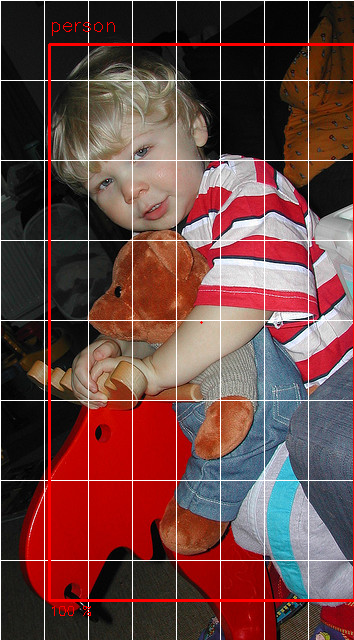

In [19]:
test = df_dataset.sample()  # essai avec une image du Dataset

class_colors = build_class_colors(list_classes)  # construction du dictionnaire des couleurs par classes

# traduction de l'output en liste des bbox avec une proba de présence supérieure à 75%
test_trad = transform_img_pred(test.at[test.index[0], 'img_y'], detection_limit=0.75, output_shape=output_shape)

# à modifier pour que ça fonctionne avec le nouveau DataSet
I = io.imread(test.at[test.index[0], 'img_url'])

# resize image
dim = (256, 256)
resized = cv2.resize(I, dim, interpolation = cv2.INTER_AREA)

# grille des cellules
for x_cell in range(8):
    cv2.line(I, (int(I.shape[1]//NB_CELLS_W)*x_cell, 0), (int(I.shape[1]//NB_CELLS_W)*x_cell, I.shape[0]), (255, 255, 255))
for y_cell in range(8):
    cv2.line(I, (0, int(I.shape[0]//NB_CELLS_H)*y_cell), (I.shape[1], int(I.shape[0]//NB_CELLS_H)*y_cell), (255, 255, 255))

for bbox in rel_coord_to_abs(test_trad, I.shape):
    [x, y, w, h, proba] = bbox
    cv2.rectangle(I, (int(x), int(y)), (int(x+w), int(y+h)), class_colors[proba[0]], 2)  # affiche rectangle 
    cv2.circle(I, tuple(int(nb) for nb in bbox_center(x, y, w, h)), 0, class_colors[proba[0]], 2)  # affiche le point central de la bbox
    cv2.putText(I, 
                f"{dict_label_classes[proba[0]]}", 
                (int(x), int(y - I.shape[0]*0.02)), 
                cv2.FONT_HERSHEY_SIMPLEX, 
                I.shape[0]/1000, 
                class_colors[proba[0]])  # affiche la classe
    cv2.putText(I, 
                f"{int(proba[1]*100)} %", 
                (int(x), int(y + h + I.shape[0]*0.023)), 
                cv2.FONT_HERSHEY_SIMPLEX, 
                I.shape[0]/1500, 
                class_colors[proba[0]])  # affiche la proba de présence

cv2_imshow(cv2.cvtColor(I, cv2.COLOR_RGB2BGR))

test redimensionnement de la même image

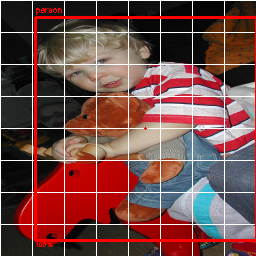

In [20]:
# grille des cellules
for x_cell in range(8):
    cv2.line(resized, (int(resized.shape[1]//NB_CELLS_W)*x_cell, 0), (int(resized.shape[1]//NB_CELLS_W)*x_cell, resized.shape[0]), (255, 255, 255))
for y_cell in range(8):
    cv2.line(resized, (0, int(resized.shape[0]//NB_CELLS_H)*y_cell), (resized.shape[1], int(resized.shape[0]//NB_CELLS_H)*y_cell), (255, 255, 255))

for bbox in rel_coord_to_abs(test_trad, resized.shape):
    [x, y, w, h, proba] = bbox
    cv2.rectangle(resized, (int(x), int(y)), (int(x+w), int(y+h)), class_colors[proba[0]], 2)  # affiche rectangle 
    cv2.circle(resized, tuple(int(nb) for nb in bbox_center(x, y, w, h)), 0, class_colors[proba[0]], 2)  # affiche le point central de la bbox
    cv2.putText(resized, 
                f"{dict_label_classes[proba[0]]}", 
                (int(x), int(y - resized.shape[0]*0.02)), 
                cv2.FONT_HERSHEY_SIMPLEX, 
                resized.shape[0]/1000, 
                class_colors[proba[0]])  # affiche la classe
    cv2.putText(resized, 
                f"{int(proba[1]*100)} %", 
                (int(x), int(y + h + resized.shape[0]*0.023)), 
                cv2.FONT_HERSHEY_SIMPLEX, 
                resized.shape[0]/1500, 
                class_colors[proba[0]])  # affiche la proba de présence

cv2_imshow(cv2.cvtColor(resized, cv2.COLOR_RGB2BGR))

## <a name="III"></a>III - DataVis

Points intéressant à étudier :

- extraire et comparer les dimensions des images -> mini ? (OK)
- heatmap des classes sur les cellules (effets de bords ?) (OK)
- répartition des centres des bboxes par classe dans une cellule (OK)
- h et w des bboxes par classes (OK)
- répartition des classes dans les détections (OK)
- test affichage de toutes les bboxes couleurs diff par classes sur image 256x256 ? (non pertinent)



In [21]:
df_exploration = df_dataset.copy()
print(f"Nombre total d'images du DataSet : {len(df_exploration)} images.")

Nombre total d'images du DataSet : 49392 images.


### <a name="III.1"></a>III.1 - Etude des dimensions des images

On va récupérer les images et extraire leurs dimensions (peut durer plusieurs minutes en fonction de la connexion).

In [22]:
def get_shapes_from_COCO(list_classes, dataDir='.', dataType='train', year='2017', super_categories=False):
    """
    Récupère les dimensions des images du DataSet et les combine dans une DataFrame.
    Retourne la dataframe[[url, height, width]]
    """

    # chargement de l'API COCO
    coco = init_COCO(dataDir='.', dataType='train', year='2017')  # main # supprimer l'instance une fois le chargement et la traduction effectuée

    # teste si les classes données sont valides pour le DataSet COCO
    are_classes_valid(list_classes, coco, super_categories=False)
    nb_classes = len(list_classes)  # on capte le nombre de classes

    # création des dictionnaires des classes 
    dict_coco_classes, dict_label_classes = build_dict_classes(list_classes, coco, super_categories=False)
    catIds = list(dict_coco_classes.keys())  # liste des ID des catégories COCO

    # liste des images pour les classes voulues
    imgIds = get_imgIds_list(catIds, coco)  
    print(f"Total : {len(imgIds)} images before processing.")

    # dictionnaires des résultats
    dict_res = {'img_url': [],     # url
                'img_height': [],  # height
                'img_width': []}   # width
    bad_imgs_counter = 0  # initialisation du compteur d'images écartées lors du traitement

    for imgId in imgIds:
        # extraire les infos de l'image
        img = coco.loadImgs(imgId)[0]  # charge une image de la liste

        dict_res['img_url'].append(img['coco_url'])  # pour extraire l'url dans le dict_res
        dict_res['img_height'].append(img['height'])  # pour extraire h dans le dict_res
        dict_res['img_width'].append(img['width'])  # pour extraire w dans le dict_res

    del coco  # on supprime l'instance de l'API COCO pour gagner de la mémoire

    print(f"{bad_imgs_counter} images were discarded")
    return pd.DataFrame(dict_res)  # retourne la dataframe[[url, height, width]]

In [23]:
df_shapes = get_shapes_from_COCO(list_classes, dataDir='.', dataType='train', year='2017', super_categories=False)

loading annotations into memory...
Done (t=17.86s)
creating index...
index created!
Total : 67536 images before processing.
0 images were discarded


In [24]:
df_exploration = df_exploration.merge(df_shapes, on='img_url', how='left')
df_exploration.head()

,img_url,img_y,img_height,img_width
0,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",640,480
1,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",426,640
2,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",480,640
3,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",446,640
4,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",640,427


In [25]:
df_exploration[['img_height', 'img_height']].describe().round()

,img_height,img_height
count,49392.0,49392.0
mean,489.0,489.0
std,99.0,99.0
min,51.0,51.0
25%,427.0,427.0
50%,480.0,480.0
75%,612.0,612.0
max,640.0,640.0


Plus de 75 % des images ont des largeurs supérieures à 427, idem pour les hauteurs.

Le modèle Yolo a été entrainé sur des images de 224 x 224 et utilise des images de 448 x 448 pour la détection.

Regardons le nombre d'images avec des dimensions inférieures :

In [26]:
for test_dim in [128, 224, 256, 448]:
    print(f"Nombre d'images avec une de ses dimensions inférieure à {test_dim} :", end=" ")
    print(len(df_exploration[(df_exploration['img_height'] <= test_dim) | (df_exploration['img_width'] <= test_dim)]))

Nombre d'images avec une de ses dimensions inférieure à 128 : 13
Nombre d'images avec une de ses dimensions inférieure à 224 : 152
Nombre d'images avec une de ses dimensions inférieure à 256 : 326
Nombre d'images avec une de ses dimensions inférieure à 448 : 28368


Il peut être judicieux d'exclure des images avec des dimensions trop faibles. On pourrait exclure sans trop de soucis des images avec des dimensions inférieures 256 x 256.

### <a name="III.2"></a>III.2 - Heatmap des classes sur les cellules

On va tout d'abord extraire les cartes de détection, de dimensions S x S, pour chaque classe et pour chaque image.

In [27]:
dict_label_classes.keys()

dict_keys([0, 1])

In [28]:
for class_nmb in dict_label_classes.keys():
    df_exploration[f'map_{dict_label_classes[class_nmb]}'] = df_exploration['img_y'].apply(lambda x: x[..., 5 + class_nmb].reshape(output_shape))
df_exploration.head()

,img_url,img_y,img_height,img_width,map_person,map_cat
0,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",640,480,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0...."
1,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",426,640,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [1....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0...."
2,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",480,640,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0...."
3,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",446,640,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0...."
4,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",640,427,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0...."


On va également en profiter pour compter le nombre de détection de chaque classes, pour chaque image.

In [29]:
dict_label_classes.values()

dict_values(['person', 'cat'])

In [30]:
for class_label in dict_label_classes.values():
    df_exploration[f'nb_{class_label}'] = df_exploration[f'map_{class_label}'].apply(lambda x: x.sum())
df_exploration.head()

,img_url,img_y,img_height,img_width,map_person,map_cat,nb_person,nb_cat
0,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",640,480,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....",1.0,0.0
1,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",426,640,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [1....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....",1.0,0.0
2,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",480,640,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....",1.0,0.0
3,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",446,640,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....",3.0,0.0
4,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",640,427,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0....",1.0,0.0


In [31]:
for class_label in dict_label_classes.values():
    print(f"Nombre d'images de la classe {class_label} : {len(df_exploration[df_exploration[f'nb_{class_label}'] != 0 ])}")
    print(f"Nombre de détections de la classe {class_label} : {int(df_exploration[f'nb_{class_label}'].values.sum())}")
    print()

Nombre d'images de la classe person : 45985
Nombre de détections de la classe person : 94120

Nombre d'images de la classe cat : 4028
Nombre de détections de la classe cat : 4590



Il y a 10 fois plus d'images avec la classe `person` que d'image avec la classe `cat`.

Il y a également 20 fois plus de détections de la classe `person` que pour la classe `cat`.

Il y a donc un déséquilibre entre les deux classes. Il pourrait donc être intéressant de réduire le nombre d'images de la classe `person` pour un dataset plus équilibré. Notons toutefois que beaucoup membres sont également détectés pour la classe `person`. Il pourrait donc être intéressant de garder un peu plus des images de cette classe pour aider le modèle à détecter des "parties" de `person`.

La détection de membres peut également être problématique : plusieurs bbox pour une seule personne (idée : supprimer les photos où des bbox sont incluses dans d'autres, puis si des bboxes se superposent lors de la détection, supprimer celle incluse ou les fusionner?)

Il faut encore voir la distribution du nombre de détection par image pour chaque classe.

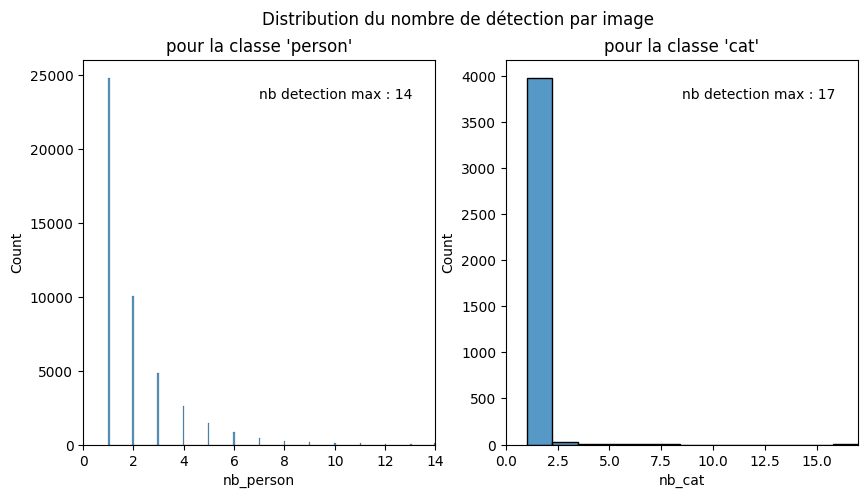

In [32]:
from matplotlib import axes
# calcul du nombre de graphs à afficher et l'ordre d'affichage
nb_lignes = len(dict_label_classes)//4 + 1
if len(dict_label_classes) <= 4:
    nb_colonnes = len(dict_label_classes)
else:
    nb_colonnes = 4

# instanciation de la figure
fig, axs = plt.subplots(nb_lignes, 
                        nb_colonnes, 
                        figsize=(5*nb_colonnes, 5*nb_lignes))

fig.suptitle("Distribution du nombre de détection par image")

# affichage des distributions dans chaque ax (un par classe)
for class_label, ax in zip(dict_label_classes.values(), axs.reshape(-1)):
    sns.histplot(data=df_exploration[df_exploration[f'nb_{class_label}'] != 0], 
                 x=f'nb_{class_label}', 
                 ax=ax)
    ax.set_title(f"pour la classe '{class_label}'")
    ax.set_xlim(0, df_exploration[f'nb_{class_label}'].max())
    ax.annotate(f"nb detection max : {int(df_exploration[f'nb_{class_label}'].max())}", 
                (0.5, 0.9), xycoords='axes fraction')

plt.plot();

Il pourrait être intéressant de se débarrasser des valeurs extrèmes.  
1- enlever les bboxes trop petites  
2- supprimer les valeurs extrèmes si il en reste

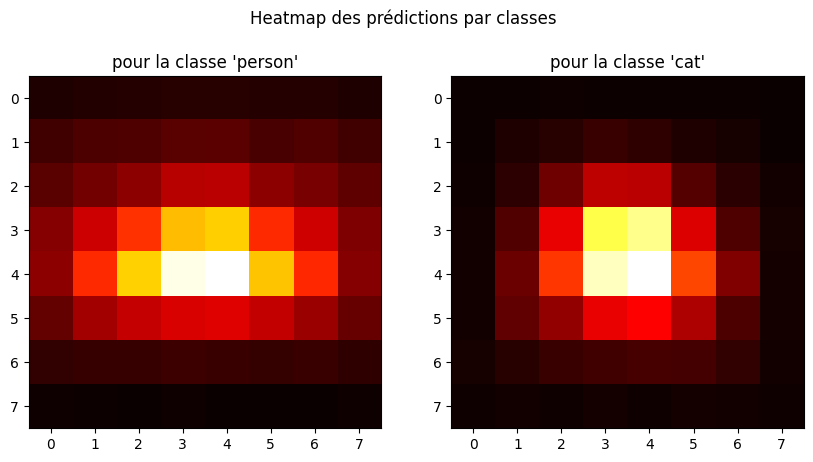

In [33]:
# calcul du nombre de graphs à afficher et l'ordre d'affichage
nb_lignes = len(dict_label_classes)//4 + 1
if len(dict_label_classes) <= 4:
    nb_colonnes = len(dict_label_classes)
else:
    nb_colonnes = 4

# instanciation de la figure
fig, axs = plt.subplots(nb_lignes, 
                        nb_colonnes, 
                        figsize=(5*nb_colonnes, 5*nb_lignes))

fig.suptitle("Heatmap des prédictions par classes")

# affichage des heatmap des prédictions dans chaque ax (un par classe)
for class_label, ax in zip(dict_label_classes.values(), axs.reshape(-1)):
    a = df_exploration[f'map_{class_label}'].sum()
    ax.imshow(a, cmap='hot', interpolation='nearest')
    ax.set_title(f"pour la classe '{class_label}'")

plt.show();

Comme on pouvait s'y attendre, il y a un risque d'effet de bords. En effet il y a peut de prédictions pour les cellules au bord de l'image.
L'effet est encore plus marqué pour la classe `cat` que pour la classe `person` -> risque de biais sur les bords gauche et droit en faveur d'une prédiction pour la classe `person`.

### <a name="III.3"></a>III.3 - Répartition des centres des bboxes par classe dans une cellule

In [34]:
# extraction des valeurs des centres
xc_rel = np.concatenate(df_exploration['img_y'].apply(lambda x: x[..., 1]).to_list()).reshape(-1, 1)
yc_rel = np.concatenate(df_exploration['img_y'].apply(lambda x: x[..., 2]).to_list()).reshape(-1, 1)

# on en profite pour extraire les valeurs des largeurs et hauteurs
w_rel = np.concatenate(df_exploration['img_y'].apply(lambda x: x[..., 3]).to_list()).reshape(-1, 1)
h_rel = np.concatenate(df_exploration['img_y'].apply(lambda x: x[..., 4]).to_list()).reshape(-1, 1)

# et les valeurs des classes
list_classes_arrays = []
list_newcols = []
for class_nmb in dict_label_classes.keys():
    list_classes_arrays.append(np.concatenate(df_exploration['img_y'].apply(lambda x: x[..., 5 + class_nmb]).to_list()).reshape(-1, 1))
    list_newcols.append(dict_label_classes[class_nmb])

array_coord = np.concatenate([xc_rel, yc_rel, w_rel, h_rel] + list_classes_arrays, axis=1)
df_coord = pd.DataFrame(array_coord[array_coord.sum(axis=1) != 0], columns=(['xc_rel', 'yc_rel', 'w_rel', 'h_rel'] + list_newcols))
df_coord.head()

,xc_rel,yc_rel,w_rel,h_rel,person,cat
0,0.878917,0.617937,0.298938,0.329609,1.0,0.0
1,0.831687,0.941596,0.207922,0.480892,1.0,0.0
2,0.566313,0.016500,0.884828,0.995875,1.0,0.0
3,0.177625,0.756682,0.014094,0.058722,1.0,0.0
4,0.883687,0.947982,0.165703,0.512960,1.0,0.0


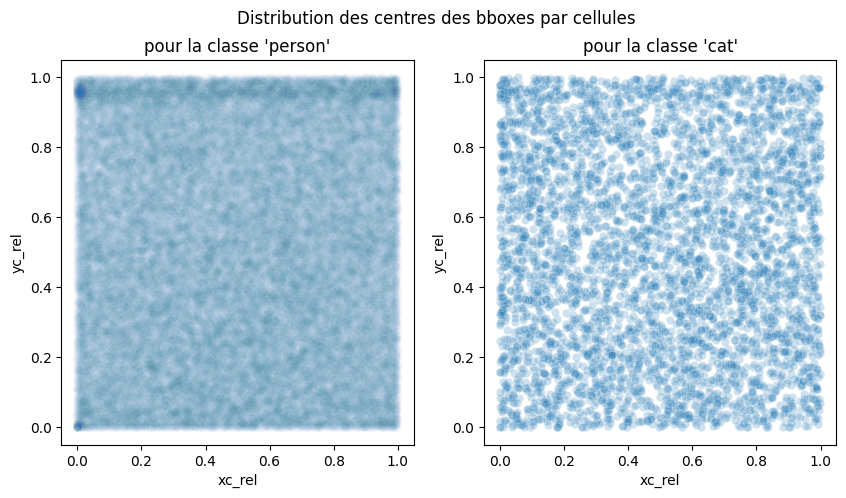

In [35]:
from matplotlib import axes
# calcul du nombre de graphs à afficher et l'ordre d'affichage
nb_lignes = len(dict_label_classes)//4 + 1
if len(dict_label_classes) <= 4:
    nb_colonnes = len(dict_label_classes)
else:
    nb_colonnes = 4

# instanciation de la figure
fig, axs = plt.subplots(nb_lignes, 
                        nb_colonnes, 
                        figsize=(5*nb_colonnes, 5*nb_lignes))

fig.suptitle("Distribution des centres des bboxes par cellules")

# affichage des distributions dans chaque ax (un par classe)
for class_label, ax in zip(dict_label_classes.values(), axs.reshape(-1)):
    sns.scatterplot(data=df_coord[df_coord[class_label]==1], 
                    x='xc_rel', y='yc_rel', 
                    alpha=(1000/len(df_coord[df_coord[class_label] == 1])),  # mieux pour voir la répartition des points
                    ax=ax)
    ax.set_title(f"pour la classe '{class_label}'")

plt.plot();

Position plutôt aléatoire pour `cat`, pas de problèmes.
Pour `person` semble plus problématique : semble y avoir plus de centres sur les bords (notament celui du haut et de gauche) et les coins (en haut à gauche, en bas à gauche et en haut à droite). à voir une fois les données nettoyées.

### <a name="III.4"></a>III.4 - h et w des bboxes par classes

In [36]:
# construction de la colonne des label des classes
df_coord['class'] = np.NaN
for class_label in dict_label_classes.values():
    df_coord.loc[df_coord[class_label] == 1,'class'] = class_label
df_coord.head()

,xc_rel,yc_rel,w_rel,h_rel,person,cat,class
0,0.878917,0.617937,0.298938,0.329609,1.0,0.0,person
1,0.831687,0.941596,0.207922,0.480892,1.0,0.0,person
2,0.566313,0.016500,0.884828,0.995875,1.0,0.0,person
3,0.177625,0.756682,0.014094,0.058722,1.0,0.0,person
4,0.883687,0.947982,0.165703,0.512960,1.0,0.0,person


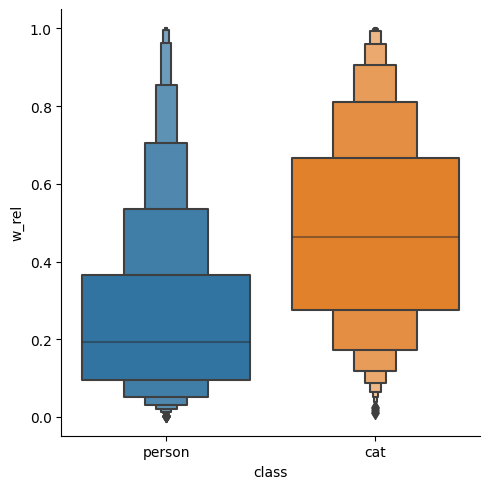

In [37]:
# distributions des largeurs relatives des bboxes
sns.catplot(data=df_coord, x='class', y='w_rel', kind='boxen');

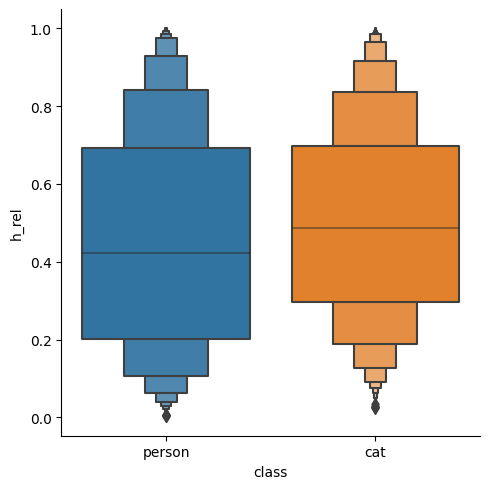

In [38]:
# distributions des hauteurs relatives des bboxes
sns.catplot(data=df_coord, x='class', y='h_rel', kind='boxen');

Les largeurs et hauteurs des bboxes de `cat` sont plutôt équlibrées.

Celles de `person` ont tendance à être plus petites (vues de très loin), et peu large, ce qui est normal : poition debout. => voir ce que ça donne après nettoyage. Est-il possible de faire des rotations des images en gardant une bbox correcte ?

### <a name="III.5"></a>III.5 - bboxes moyennes et variations par classes

Nous allons aussi essayer d'afficher les bbox moyennes, et les variations pour chaque classe.

In [39]:
# on transforme les prédictions en coordonnées bbox relatives list([x, y, w, h, proba]) pour chaque image
df_exploration['pred_bboxs'] = df_exploration['img_y'].apply(lambda x: transform_img_pred(x, detection_limit=0.75, output_shape=output_shape))

In [40]:
def bbox_list2array(bboxes):
    """
    transforme la liste des coordonnées obtenue par transform_img_pred() en arrays x_rel, y_rel, h_rel, 
    """
    list_coords = []
    for bbox_list in bboxes:
        bbox_coords = bbox_list[:4]
        bbox_class = [bbox_list[4][0]]
        list_coords.append(np.array(bbox_coords + bbox_class).reshape(1, -1))
    
    return np.concatenate(list_coords)

In [41]:
# on transforme ensuite les listes de bbox précédentes en array([[x, y, w, h, class]])
df_exploration['array_bboxs'] = df_exploration['pred_bboxs'].apply(lambda x: bbox_list2array(x))

In [42]:
# création de la DataFrame des coordonnées
all_bboxes = np.concatenate(df_exploration['array_bboxs'].to_list())  # concaténation de toutes les bboxes du DataSet
df_bboxes = pd.DataFrame(all_bboxes, columns=['x_rel', 'y_rel', 'w_rel', 'h_rel', 'class'])
df_bboxes['class'] = df_bboxes['class'].apply(lambda x: dict_label_classes[x]) # traduction des classes
df_bboxes.sample()

,x_rel,y_rel,w_rel,h_rel,class
62914,0.532578,0.253937,0.308438,0.417979,person


In [43]:
# on va visualiser les bbox sur une image de 256 x 256.
# on calcule donc les coordonnées absolues sur une image de cette taille
img_vis_shape = (256, 256)  # (h, w)
for coord in [x for x in df_bboxes.columns if x != 'class']:
    if ('x' in coord) or ('w' in coord): 
        df_bboxes[coord.replace('_rel', '')] = df_bboxes[coord].apply(lambda x: x * img_vis_shape[1])
    else:
        df_bboxes[coord.replace('_rel', '')] = df_bboxes[coord].apply(lambda x: x * img_vis_shape[0])
df_bboxes.sample()

,x_rel,y_rel,w_rel,h_rel,class,x,y,w,h
11066,0.888219,0.266792,0.100031,0.224906,person,227.384,68.298868,25.608,57.575849


In [44]:
def build_img_bbox_mask(x, y, w, h, img_vis_shape=img_vis_shape):
    """
    Construit le masque de la bbox dont les coordonnées sont passées en arguments
    """
    res = np.zeros(img_vis_shape)
    res[int(y):int(y+h), int(x):int(x+w)] = 1
    return res.reshape(*img_vis_shape, 1)  # redimension en (h, w, channels)

In [45]:
def build_img_bbox(x, y, w, h, img_vis_shape=img_vis_shape):
    """
    Construit les contours la bbox dont les coordonnées sont passées en arguments
    """
    res = np.zeros(img_vis_shape)
    res[int(y):int(y+h), int(x):int(x+w)] = 1
    res[int(y+1):int(y+h-1), int(x+1):int(x+w-1)] = 0
    return res.reshape(*img_vis_shape, 1)  # redimension en (h, w, channels)

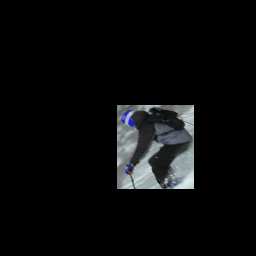

In [46]:
# test avec le masque de la première image du DataSet
test_mask = build_img_bbox_mask(*df_bboxes.iloc[0][['x', 'y', 'w', 'h']], img_vis_shape=img_vis_shape)
test_I = io.imread(df_exploration.at[df_exploration.index[0], 'img_url'])
test_resized = cv2.resize(test_I, img_vis_shape, interpolation=cv2.INTER_AREA)  # on redimensionne l'image pour avoir les mêmes dimensions que le masque
masked_image = test_resized * test_mask  # on applique le masque à l'image
cv2_imshow(masked_image)  # affiche le résultat

In [47]:
# masque moyen de toutes les images
middle_mask = np.zeros((*img_vis_shape, 1))
for line in df_bboxes.index:
    middle_mask += build_img_bbox_mask(*df_bboxes.loc[line][['x', 'y', 'w', 'h']], img_vis_shape=img_vis_shape)

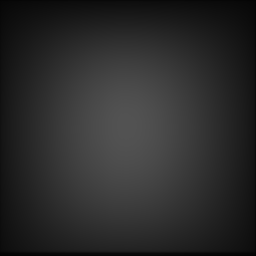

In [48]:
cv2_imshow(middle_mask/len(df_bboxes)*255)

La visualisation par masques ne semble pas être pertinente.

In [49]:
show_vis_middle = False  # modifier pour True pour voir la visualisation (chronophage)

In [50]:
# contours moyens de toutes les images
if show_vis_middle:
    middle_bbox = np.zeros((*img_vis_shape, 1))
    for line in df_bboxes.index:
        middle_bbox += build_img_bbox(*df_bboxes.loc[line][['x', 'y', 'w', 'h']], img_vis_shape=img_vis_shape)

In [51]:
if show_vis_middle:
    cv2_imshow(middle_bbox/len(df_bboxes)*255)

Idem pour les contours.

In [52]:
if show_vis_middle:
    # masque moyen par classe
    middle_mask_person = np.zeros((*img_vis_shape, 1))
    for line in df_bboxes[df_bboxes['class'] == 'person'].index:
        middle_mask_person += build_img_bbox_mask(*df_bboxes.loc[line][['x', 'y', 'w', 'h']], img_vis_shape=img_vis_shape)

    middle_mask_cat = np.zeros((*img_vis_shape, 1))
    for line in df_bboxes[df_bboxes['class'] == 'cat'].index:
        middle_mask_cat += build_img_bbox_mask(*df_bboxes.loc[line][['x', 'y', 'w', 'h']], img_vis_shape=img_vis_shape)

In [53]:
if show_vis_middle:
    cv2_imshow(middle_mask_person/len(df_bboxes[df_bboxes['class'] == 'person'])*255)

In [54]:
if show_vis_middle:
    cv2_imshow(middle_mask_cat/len(df_bboxes[df_bboxes['class'] == 'cat'])*255)

### <a name="III.6"></a>III.6 - Correction des données

DataSet : supprimer les images de `person` avec des bboxes trop petites et/ou avec trop de bboxes ? ainsi que celles avec des bboxes incluses ?
Supprimer les image avec un trop grand nombre de détection ? effectuer des translations pour limiter les effets de bord (comment déplacer les bboxes ? -> sortie des bboxes des bords de l'image ?) ?


**ATTENTION ! Cette partie est plus spécifique au projet Moustik-CAM, les seules classes étudiées sont `person` et `cat`.**

In [55]:
# choses à nettoyer :
corr_size = True  # supprime les images plus petites que la taille de l'input
# True par défaut

corr_too_much = True  # supprime les images avec plus de 4 détections
nb_detection_max = 4
# True par défaut

corr_too_small = False  # supprime les images avec des bbox plus petites que la taille d'une cellule
proportion_cell = 1
# False par défaut


corr_disparities = True  # réduit le nombre d'images de la classe "person"
disparities_limit = 10_000
# True par défaut

In [56]:
df_corr = df_exploration.copy()

In [57]:
for label in dict_label_classes.values():
    print(f"Classe '{label}' :")
    for test_dim in [128, 224, 256, 448]:
        print(f"    Nombre d'images avec une de ses dimensions inférieure à {test_dim} :", end=" ")
        print(f"    {len(df_corr[((df_corr['img_height'] <= test_dim) | (df_corr['img_width'] <= test_dim)) & (df_corr[f'nb_{label}'] != 0)])}")

Classe 'person' :
    Nombre d'images avec une de ses dimensions inférieure à 128 :     10
    Nombre d'images avec une de ses dimensions inférieure à 224 :     137
    Nombre d'images avec une de ses dimensions inférieure à 256 :     297
    Nombre d'images avec une de ses dimensions inférieure à 448 :     26686
Classe 'cat' :
    Nombre d'images avec une de ses dimensions inférieure à 128 :     3
    Nombre d'images avec une de ses dimensions inférieure à 224 :     19
    Nombre d'images avec une de ses dimensions inférieure à 256 :     37
    Nombre d'images avec une de ses dimensions inférieure à 448 :     2008


On a environ les distributions de dimensions d'images entre les deux classes. On va supprimer celles inférieurs à 256 x 256.

In [58]:
if corr_size:
    df_corr = df_corr[(df_corr['img_height'] >= 256) | (df_corr['img_width'] >= 256)]

Suppression des images avec plus de x détections.

In [59]:
if corr_too_much:
    for label in dict_label_classes.values():
        df_corr = df_corr[df_corr[f'nb_{label}'] <= nb_detection_max]

Suppression des bbox trop petites.

In [60]:
# on transforme les prédictions en coordonnées bbox relatives x, y, w, h, proba
df_corr['pred_bboxs'] = df_corr['img_y'].apply(lambda x: transform_img_pred(x, detection_limit=0.75, output_shape=output_shape))

In [61]:
# on extrait uniquement les coordonnées
df_corr['bboxs_only'] = df_corr['pred_bboxs'].apply(lambda x: [bbox[:4] for bbox in x])

In [62]:
# extraction des hauteurs et largeurs relatives
df_corr['list_wrel'] = df_corr['bboxs_only'].apply(lambda x: [coord[2] for coord in x])
df_corr['list_hrel'] = df_corr['bboxs_only'].apply(lambda x: [coord[3] for coord in x])

In [63]:
# fonction pour tester les largeurs et hauteurs
def not_too_small(x, proportion_cell=proportion_cell, axis='w', output_shape=output_shape):
    """
    Regarde dans la liste si une des valeurs est inférieure à une valeur limite.
    Retourne un booléen.
    """

    if axis == 'w':
        limit = proportion_cell/output_shape[1]
    if axis == 'h':
        limit = proportion_cell/output_shape[0]

    res = True
    for el in x:
        if el < limit:
            res = False

    return res

Il est peu probable, dans mon cas, que la bbox pour un humain soit inférieure à une cellule. On va donc tester en éliminant les bbox inférieures aux dimensions d'une cellule pour les humains

In [64]:
if corr_too_small:
    # pour les w
    df_corr = df_corr[(df_corr['nb__cat'] != 0) | (df_corr['list_wrel'].apply(lambda x: not_too_small(x, axis='w')))]
    # pour les h
    df_corr = df_corr[(df_corr['nb__cat'] != 0) | (df_corr['list_hrel'].apply(lambda x: not_too_small(x, axis='h')))]

Problème : on pourrait avoir trop de disparités entre les classes sur les dimensions des bbox.

à voir ce qui change avec ou sans cette correction.

On peut, par contre essayer de réduire le nombre d'images de la classe `person` aléatoirement pour conserver au mieux les "propriétés" du DataSet.

In [65]:
# réduction aléatoire du nombre d'images de la classe personnes
if corr_disparities:
    while len(df_corr[df_corr['nb_person'] != 0]) > disparities_limit:
        rnd_elimination = np.random.randint(0, 2, (len(df_corr),))
        df_corr = df_corr[(df_corr['nb_cat'] != 0) | rnd_elimination]

Dans ce cas, le DataSet est plus équilibré p/r au nombre d'images par classe détectée.

Notre nouveau DataSet est donc :

In [66]:
df_dataset_corr = df_corr[['img_url', 'img_y']].reset_index(drop=True).copy()
print("Longueur totale du nouveau DataSet :", len(df_dataset_corr), "images.")
df_dataset_corr.head()

Longueur totale du nouveau DataSet : 9224 images.


,img_url,img_y
0,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
1,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
2,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
3,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
4,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."


### <a name="III.7"></a>III.7 - Nouvelle DataVis

Nouvelles distributions des classes

In [67]:
for class_label in dict_label_classes.values():
    print(f"Nombre d'images de la classe {class_label} : {len(df_corr[df_corr[f'nb_{class_label}'] != 0 ])}")
    print(f"Nombre de détections de la classe {class_label} : {int(df_corr[f'nb_{class_label}'].values.sum())}")
    print()

Nombre d'images de la classe person : 5831
Nombre de détections de la classe person : 9489

Nombre d'images de la classe cat : 4004
Nombre de détections de la classe cat : 4503



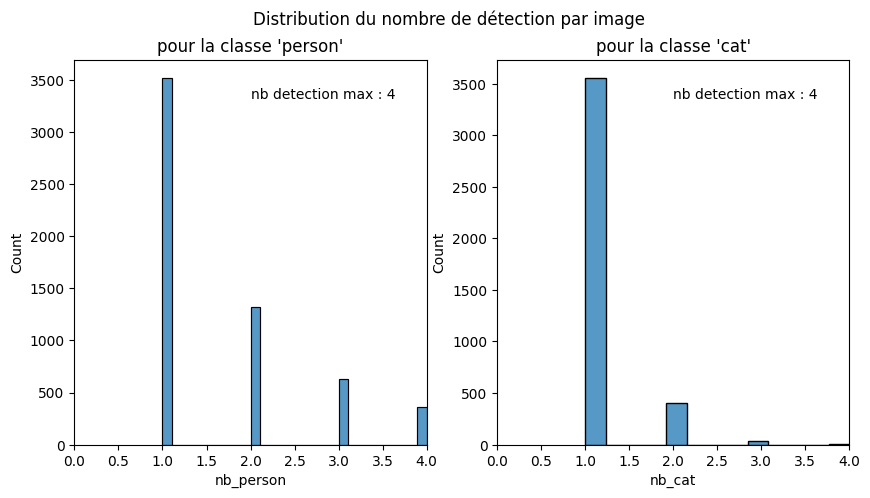

In [68]:
# calcul du nombre de graphs à afficher et l'ordre d'affichage
nb_lignes = len(dict_label_classes)//4 + 1
if len(dict_label_classes) <= 4:
    nb_colonnes = len(dict_label_classes)
else:
    nb_colonnes = 4

# instanciation de la figure
fig, axs = plt.subplots(nb_lignes, 
                        nb_colonnes, 
                        figsize=(5*nb_colonnes, 5*nb_lignes))

fig.suptitle("Distribution du nombre de détection par image")

# affichage des distributions dans chaque ax (un par classe)
for class_label, ax in zip(dict_label_classes.values(), axs.reshape(-1)):
    sns.histplot(data=df_corr[df_corr[f'nb_{class_label}'] != 0], 
                 x=f'nb_{class_label}', 
                 ax=ax)
    ax.set_title(f"pour la classe '{class_label}'")
    ax.set_xlim(0, df_corr[f'nb_{class_label}'].max())
    ax.annotate(f"nb detection max : {int(df_corr[f'nb_{class_label}'].max())}", 
                (0.5, 0.9), xycoords='axes fraction')

plt.plot();

Nouvelles HeatMaps

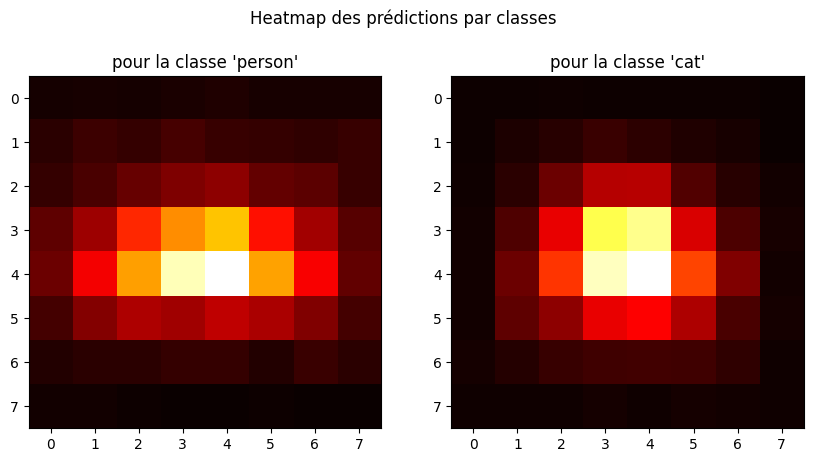

In [69]:
# calcul du nombre de graphs à afficher et l'ordre d'affichage
nb_lignes = len(dict_label_classes)//4 + 1
if len(dict_label_classes) <= 4:
    nb_colonnes = len(dict_label_classes)
else:
    nb_colonnes = 4

# instanciation de la figure
fig, axs = plt.subplots(nb_lignes, 
                        nb_colonnes, 
                        figsize=(5*nb_colonnes, 5*nb_lignes))

fig.suptitle("Heatmap des prédictions par classes")

# affichage des heatmap des prédictions dans chaque ax (un par classe)
for class_label, ax in zip(dict_label_classes.values(), axs.reshape(-1)):
    a = df_corr[f'map_{class_label}'].sum()
    ax.imshow(a, cmap='hot', interpolation='nearest')
    ax.set_title(f"pour la classe '{class_label}'")

plt.show();

Nouvelles répartitions des centres

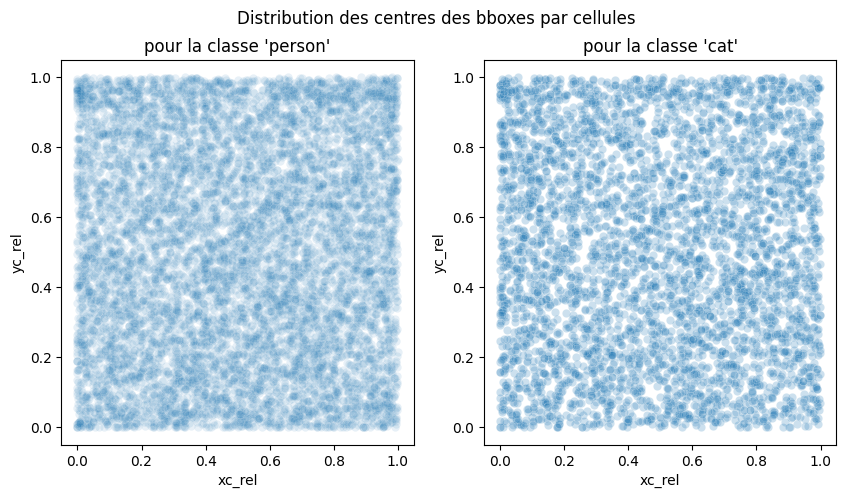

In [70]:
# extraction des valeurs des centres
xc_rel = np.concatenate(df_corr['img_y'].apply(lambda x: x[..., 1]).to_list()).reshape(-1, 1)
yc_rel = np.concatenate(df_corr['img_y'].apply(lambda x: x[..., 2]).to_list()).reshape(-1, 1)

# on en profite pour extraire les valeurs des largeurs et hauteurs
w_rel = np.concatenate(df_corr['img_y'].apply(lambda x: x[..., 3]).to_list()).reshape(-1, 1)
h_rel = np.concatenate(df_corr['img_y'].apply(lambda x: x[..., 4]).to_list()).reshape(-1, 1)

# et les valeurs des classes
list_classes_arrays = []
list_newcols = []
for class_nmb in dict_label_classes.keys():
    list_classes_arrays.append(np.concatenate(df_corr['img_y'].apply(lambda x: x[..., 5 + class_nmb]).to_list()).reshape(-1, 1))
    list_newcols.append(dict_label_classes[class_nmb])

array_coord = np.concatenate([xc_rel, yc_rel, w_rel, h_rel] + list_classes_arrays, axis=1)
df_coord2 = pd.DataFrame(array_coord[array_coord.sum(axis=1) != 0], columns=(['xc_rel', 'yc_rel', 'w_rel', 'h_rel'] + list_newcols))



# calcul du nombre de graphs à afficher et l'ordre d'affichage
nb_lignes = len(dict_label_classes)//4 + 1
if len(dict_label_classes) <= 4:
    nb_colonnes = len(dict_label_classes)
else:
    nb_colonnes = 4

# instanciation de la figure
fig, axs = plt.subplots(nb_lignes, 
                        nb_colonnes, 
                        figsize=(5*nb_colonnes, 5*nb_lignes))

fig.suptitle("Distribution des centres des bboxes par cellules")

# affichage des distributions dans chaque ax (un par classe)
for class_label, ax in zip(dict_label_classes.values(), axs.reshape(-1)):
    sns.scatterplot(data=df_coord2[df_coord2[class_label]==1], 
                    x='xc_rel', y='yc_rel', 
                    alpha=(1000/len(df_coord2[df_coord2[class_label] == 1])),  # mieux pour voir la répartition des points
                    ax=ax)
    ax.set_title(f"pour la classe '{class_label}'")

plt.plot();

Nouvelles répartitions des w, h par classes

In [71]:
# construction de la colonne des label des classes
df_coord2['class'] = np.NaN
for class_label in dict_label_classes.values():
    df_coord2.loc[df_coord2[class_label] == 1,'class'] = class_label

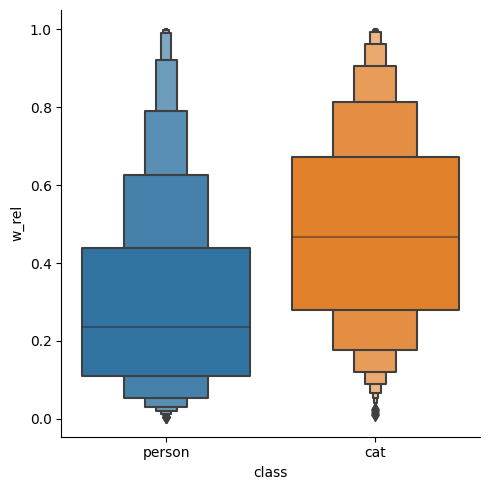

In [72]:
# distributions des largeurs relatives des bboxes
sns.catplot(data=df_coord2, x='class', y='w_rel', kind='boxen');

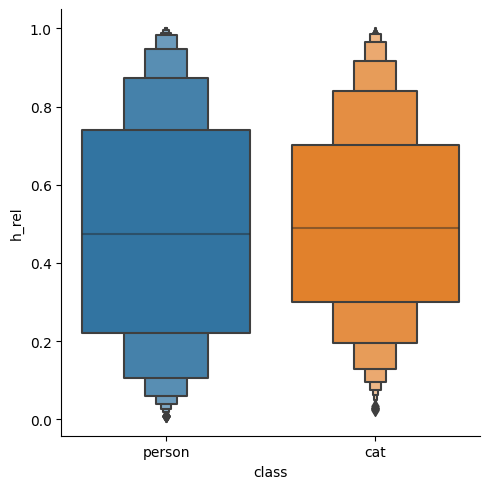

In [73]:
# distributions des hauteurs relatives des bboxes
sns.catplot(data=df_coord2, x='class', y='h_rel', kind='boxen');

## <a name="IV"></a>IV - **Modèle**

Génération : faire du Grayscale aléatoire

Problèmes d'effets de bords et de disparités dans les formes des bboxes :
- Si translations à faire -> comment modifier les bboxes en conséqence (si dépassent de l'image) ?
- Est-il possible de faire des rotations des images en gardant une bbox correcte ?

In [74]:
df_dataset_corr.head()

,img_url,img_y
0,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
1,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
2,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
3,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."
4,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0...."


On modifie le type de données des matrices de résultats en float32 pour une meilleure compatibilité plus tard.

In [75]:
df_dataset_corr['img_y'] = df_dataset_corr['img_y'].apply(lambda x: x.astype(np.float32))

In [76]:
df_dataset_corr['img_y'][0].dtype

dtype('float32')

In [77]:
df_dataset_path = df_dataset_corr.copy()
df_dataset_path['img_path'] = df_dataset_path['img_url'].apply(lambda x: x.replace('http://images.cocodataset.org/', ''))
df_dataset_path.sample()

,img_url,img_y,img_path
2179,http://images.cocodataset.org/train2017/000000...,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0....",train2017/000000028134.jpg


In [78]:
df_dataset_path = df_dataset_path[['img_path', 'img_y']]

Création des DataSet d'entraînement et de test :

In [79]:
from sklearn.model_selection import train_test_split

X_train_path, X_test_path, y_train, y_test = train_test_split(
    df_dataset_corr.img_url.values, 
    np.asarray(df_dataset_corr.img_y.to_list()),  # pour transformer y en array (car array d'array)
    train_size=0.9)

### <a name="IV.1"></a>IV.1 - Fonctions de transformation des prédictions

Pour pouvoir augmenter les données, il nous faut définir des fonctions pour traduire les matrices des résultats et les retrouver après augmentation.

In [80]:
# essai avec la première des images 
test_img_url = X_train_path[0]  # url de l'image
test_y = y_train[0]  # matrice des résultats associée
tf_y = tf.constant(test_y, dtype=tf.float32)  # transforme l'output en tenseur
resize = (256, 256)
nb_classes = len(list_classes)

Cette première fonction transforme la matrice des prédiction en tenseur [x_rel, y_rel, w_rel, h_rel, proba, class] avec une bbox pour chaque ligne. Les coordonnées sont les coordonnées relatives du point le (xmin, ymin)

In [81]:
def f_pred2relcoord(y, detection_limit=0.75, output_shape=output_shape):
    """
    Transforme les résultats du modèle en tableau regroupant les coordonnées 
    relatives, classe et probabilité de présence des bbox (au dessus de la 
    limite de détection donnée) sous forme [x_rel, y_rel, w_rel, h_rel, proba, class]
    avec une bbox par ligne.

    output_shape représente les dimensions de la grille de sortie du modèle.
    """
    """# test si l'entrée est un tenseur:
    if tf.is_tensor(y):
        y = y.numpy().copy()"""

    # matrice de sortie
    if y.shape[1] >= 6:  # s'il y a des classes
        res = np.zeros((output_shape[1] * output_shape[0], 6), dtype=np.float32)
        res[:, 5] += np.argmax(y[:, 5:], axis=1)  # classes en 1 colonne
    else:
        res = np.zeros((output_shape[1] * output_shape[0], 5), dtype=np.float32)

    # tableau des coordonnées des cellules de la grille
    n_xy = np.array(
        [[x, y] for y in range(output_shape[1]) for x in range(output_shape[0])], 
        dtype=np.float32
    )
    # proba présence :
    res[:, 4] += y[:, 0]
    # largeur et hauteur relative : 
    res[:, 2:4] += y[:, 3:5]
    # x_min et y_min relatifs :
    res[:, 0:2] += (y[:, 1:3] + n_xy)/(output_shape[1], output_shape[0]) - y[:, 3:5]/2
    
    return res[res[:, 4]>=detection_limit]

In [82]:
tf_rel_bboxes = tf.py_function(f_pred2relcoord, [test_y], [tf.float32])[0]  # retourne le même type d'objet qu'en entrée (ici un liste)

Celle-ci permet de faire l'opération inverse :

In [83]:
# opération inverse
def f_relcoord2pred(tf_rel_bboxes, output_shape=output_shape, nb_classes=nb_classes):
    """
    Retourne la matrice des résultats à partir des coordonnées relatives.

    Il faut connaître le nombre de classes utilisées.
    """
    # test si l'entrée est un tenseur:
    if tf.is_tensor(tf_rel_bboxes):
        tf_rel_bboxes = tf_rel_bboxes.numpy().copy()
    # matrice des résultats
    res = np.zeros((output_shape[1]*output_shape[0], 5+nb_classes), dtype=np.float32)
    # matrice temporaire, de même forme que l'entrée
    temp = np.zeros((tf_rel_bboxes.shape[0], 5+nb_classes), dtype=np.float32)

    temp[:, 0] += tf_rel_bboxes[:, 4]  # probabilité
    temp[:, 1:3] += tf_rel_bboxes[:, 0:2] + tf_rel_bboxes[:, 2:4]/2  # xy centre dans l'image
    temp[:, 3:5] += tf_rel_bboxes[..., 2:4]  # largeur et hauteur
    wh_cell = 1/np.array([output_shape[1], output_shape[0]], dtype=np.float32)

    
    # coordonnées de la cellule
    n_xy = temp[:, 1:3]//wh_cell  # coordonnées du centre//largeur ou hauteur cellule
    nb_cell = (n_xy[:, 0] + n_xy[:, 1] * output_shape[1])  # n° de la cellule (utile ?)

    # coordonnées du centre p/r à la cellule
    temp[:, 1:3] = (temp[:, 1:3] - n_xy * wh_cell) / wh_cell

    # classes
    if nb_classes:
        class_col = tf_rel_bboxes[:, 5].astype(np.int8)
        one_hot = np.zeros((class_col.size, class_col.max() + 1), dtype=np.float32)
        one_hot[np.arange(class_col.size), class_col] = 1  # encodage one-hot
        temp[:, 5:] = one_hot

    # résultat
    for cell, line in zip(nb_cell, temp):
        res[int(cell)] = line

    return res

In [84]:
y_new = tf.py_function(f_relcoord2pred, [tf_rel_bboxes], [tf.float32])[0]

In [85]:
# testons si on retrouve la prédiction de départ (np.allclose permet de comparer des valeurs proche, utile pour les floats)
np.allclose(y_new.numpy(), test_y)

True

Nous devons aussi pouvoir transformer les coordonnées relatives en coordonnées absolues en fonction de la taille de l'image et inversement.

In [86]:
def f_coord_rel2abs(tf_rel_bboxes, resize=resize):
    """
    Retourne le tenseur des descripteur absolus x, y, w, h, proba, class des 
    bboxes, en fonction des dimensions voulues, en fonction des descripteurs
    relatifs.
    """
    # test si l'entrée est un tenseur:
    if tf.is_tensor(tf_rel_bboxes):
        tf_rel_bboxes = tf_rel_bboxes.numpy().copy()

    # matrice des résultats
    res = np.zeros(tf_rel_bboxes.shape, dtype=np.float32)

    img_dim = np.array([resize[1], resize[0]], dtype=np.float32)
    res[:, 0:2] += tf_rel_bboxes[:, 0:2] * img_dim  # x_bbox * w_img et y_bbox * h_img
    res[:, 2:4] += tf_rel_bboxes[:, 2:4] * img_dim  # w_bbox * w_img et h_bbox * h_img
    res[:,4:] += tf_rel_bboxes[:,4:] # probas et classes s'il y en a
    return res


# opération inverse
def f_coord_abs2rel(tf_abs_bboxes, resize=resize):
    """
    Retourne le tenseur des descripteur absolus x, y, w, h, proba, class des 
    bboxes, en fonction des dimensions voulues, en fonction des descripteurs
    relatifs.
    """
    # test si l'entrée est un tenseur:
    if tf.is_tensor(tf_abs_bboxes):
        tf_abs_bboxes = tf_abs_bboxes.numpy().copy()

    # matrice des résultats
    res = np.zeros(tf_abs_bboxes.shape, dtype=np.float32)

    img_dim = np.array([resize[1], resize[0]], dtype=np.float32)
    res[:, 0:2] += tf_abs_bboxes[:, 0:2] / img_dim  # x_bbox / w_img et y_bbox / h_img
    res[:, 2:4] += tf_abs_bboxes[:, 2:4] / img_dim  # w_bbox / w_img et h_bbox / h_img
    res[:,4:] += tf_abs_bboxes[:,4:] # probas et classes s'il y en a
    return res

In [87]:
tf_abs_bboxes = tf.py_function(f_coord_rel2abs, [tf_rel_bboxes], [tf.float32])[0]

In [88]:
# testons si on retrouve le resultat précédent avec l'opération inverse
np.allclose(tf_rel_bboxes.numpy(), tf.py_function(f_coord_abs2rel, [tf_abs_bboxes], [tf.float32])[0])

True

Nous voudrons ensuite obtenir les coordonnées des points (xmin, ymin) et (xmax, ymax) à partir des coordonnées absolues et inversement.

In [89]:
def f_2point_coords(tf_abs_bboxes):
    """
    Retourne le tenseur des descripteurs x_min, y_min, x_max, y_max, class, proba
    des bboxes, en fonction des descripteur absolus.
    relatifs.
    """
    # test si l'entrée est un tenseur:
    if tf.is_tensor(tf_abs_bboxes):
        tf_abs_bboxes = tf_abs_bboxes.numpy().copy()
    
    # matrice des résultats
    res = np.zeros(tf_abs_bboxes.shape, dtype=np.float32)

    res[:, 0:2] += tf_abs_bboxes[:, 0:2]
    res[:, 2:4] += tf_abs_bboxes[:, 2:4] + tf_abs_bboxes[:, 0:2]
    res[:, 4:] += tf_abs_bboxes[:, 4:]
    return res

# opération inverse
def f_abs_from_2point(tf_2point_bboxes):
    """
    Retourne le tenseur des descripteurs x_min, y_min, x_max, y_max, class, proba
    des bboxes, en fonction des descripteur absolus.
    relatifs.
    """
    # test si l'entrée est un tenseur:
    if tf.is_tensor(tf_2point_bboxes):
        tf_2point_bboxes = tf_2point_bboxes.numpy().copy()
    
    # matrice des résultats
    res = np.zeros(tf_2point_bboxes.shape, dtype=np.float32)

    res[:, 0:2] += tf_2point_bboxes[:, 0:2]
    res[:, 2:4] += tf_2point_bboxes[:, 2:4] - tf_2point_bboxes[:, 0:2]
    res[:, 4:] += tf_2point_bboxes[:, 4:]
    return res

In [90]:
tf_2point_bboxes = tf.py_function(f_2point_coords, [tf_abs_bboxes], [tf.float32])[0]

In [91]:
# testons si on retrouve le resultat précédent avec l'opération inverse
np.allclose(tf.py_function(f_abs_from_2point, [tf_2point_bboxes], [tf.float32])[0].numpy(), tf_abs_bboxes.numpy())

True

Enfin, nous voudrons obtenir les coordonnées (xmin, ymin) et (xmax, ymax) de la "fusion" des bboxes de l'image (bbox entourant toutes les bboxes).

In [92]:
def f_bbox_minmax(tf_2point_bboxes):
    """
    Retrourne les coordonnées min et max de la "bbox" regroupant
    toutes les autres bboxes de l'image.
    """
    # test si l'entrée est un tenseur:
    if tf.is_tensor(tf_2point_bboxes):
        tf_2point_bboxes = tf_2point_bboxes.numpy().copy()
    
    # matrice des résultats
    res = np.zeros(4, dtype=np.float32)
    
    res[:2] = np.amin(tf_2point_bboxes[:, :2], axis=0)  # minimum des x_min, y_min
    res[2:] = np.amax(tf_2point_bboxes[:, 2:4], axis=0)  # maximum des x_max, y_max
    return res

In [93]:
tf.py_function(f_bbox_minmax, [tf_2point_bboxes], [tf.float32])[0]

<tf.Tensor: shape=(4,), dtype=float32, numpy=array([ 50.283516,  39.280632, 189.44513 , 198.53311 ], dtype=float32)>

### <a name="IV.2"></a>IV.2 - Fonctions de chargement des images et d'augmentation des données

In [94]:
# essai avec la première des images 
test_img_url = X_train_path[0]  # url de l'image
test_y = y_train[0]  # matrice des résultats associée
resize = (256, 256)
output_shape = (8, 8)
nb_classes = len(list_classes)

Il faut tout d'abord charger les images et tout transformer en tenseurs.

In [95]:
import requests

def load_image(img_url, y, resize=resize):
    """
    Permet de charger une image à partir de son url et de la tranformer, elle et
    sa matrice des résultats, en tenseurs. Applique un redimensionnement si besoin.
    
    """

    tf_im = tf.image.decode_jpeg(  # charge et décode l'image
        requests.get(img_url).content, 
        channels=3, 
        name="jpeg_reader")
    if resize:
        tf_im = tf.image.resize(tf_im, resize)  # redimensionne l'image

    return tf_im, y

In [96]:
tf_im, tf_y = load_image(test_img_url, test_y, resize=resize)

Il nous faut aussi une fonction pour afficher les images.

In [97]:
def show_bounding_box(tf_im, tf_y, dict_label_classes=dict_label_classes, 
                      nb_classes=nb_classes, detection_limit=0.75, output_shape=output_shape):
    """
    Permet d'afficher une image et ses bboxes à partir des tenseurs.
    """
    # test si l'entrée tf_y est un tenseur:
    if tf.is_tensor(tf_y):
        tf_y = tf_y.numpy().copy()

    color = plt.cm.rainbow(np.linspace(0, 1, nb_classes))  # colormap en fonction du nombre de classes

    np_abs_bboxes = f_2point_coords(  # récupère les coordonnées absolues
        f_coord_rel2abs(
            f_pred2relcoord(tf_y, detection_limit=detection_limit, output_shape=output_shape), 
            resize=resize)
    )
    
    # test si l'entrée tf_im est un tenseur:
    if tf.is_tensor(tf_im):
        tf_im = tf_im.numpy().copy()

    plt.imshow(tf_im.astype(int))  # Affiche l'image

    for np_bbox in np_abs_bboxes:
        if nb_classes:
            x1, y1, x2, y2, proba, class_nmb = np_bbox
            plt.plot([x1,x2,x2,x1,x1], [y1,y1,y2,y2,y1], c=color[int(class_nmb)])  # Affiche la bounding box
            plt.text(  # affiche le label et la proba de présence
                x1, y1-5,
                f"{dict_label_classes[class_nmb].capitalize()} - {int(proba*100)}%",
            )
        else:
            x1, y1, x2, y2, proba = np_bbox
            plt.plot([x1,x2,x2,x1,x1], [y1,y1,y2,y2,y1],'r')  # Affiche la bounding box
            plt.text(  # affiche le label et la proba de présence
                x1, y1-5,
                f"{int(proba*100)}%",
            )

    plt.axis('off')

671


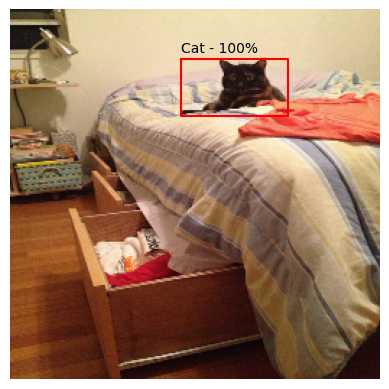

In [98]:
n = np.random.randint(0, len(X_train_path))
print(n)
test_img_url = X_train_path[n]  # url de l'image
test_y = y_train[n]  # matrice des résultats associée
tf_im, tf_y = load_image(test_img_url, test_y, resize=resize)
show_bounding_box(tf_im, tf_y, dict_label_classes=dict_label_classes, 
                  nb_classes=nb_classes, detection_limit=0.75, output_shape=output_shape)

Il nous faut pouvoir appliquer aléatoirement une translation à nos images, en fonction des limitations imposées par nos bboxes.

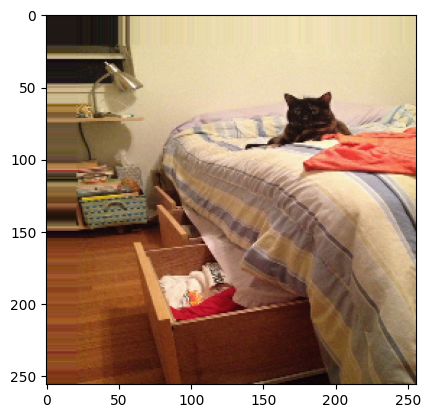

In [99]:
# exemple de translation
_res_im = tf.keras.preprocessing.image.apply_affine_transform(
        tf_im.numpy(), theta=0, tx=-20, ty=-20, shear=0, zx=1, zy=1, row_axis=0, 
        col_axis=1, channel_axis=2, fill_mode='nearest', cval=0.0, order=1
    )
plt.imshow(_res_im.astype(int));

NB : translater une image de (-20, -20) signifie décaler le centre de l'image à (xc + 20, yc + 20).

Il faut faire attention à ce que nos modifications ne donne pas une image avec plusieurs centres dans une même cellule.

In [100]:
def f_ismulticenter(tf_abs_bboxes, output_shape=output_shape):
    """
    Retourne la matrice des résultats à partir des coordonnées relatives.

    Il faut connaître le nombre de classes utilisées.
    """
    # test si l'entrée est un tenseur:
    if tf.is_tensor(tf_abs_bboxes):
        tf_abs_bboxes = tf_abs_bboxes.numpy().copy()
    
    # transformation en coordonnées relatives
    np_rel_bboxes = f_coord_abs2rel(tf_abs_bboxes, resize=resize)

    xy_center = np_rel_bboxes[..., 0:2] + np_rel_bboxes[..., 2:4]/2
    wh_cell = 1/np.array([output_shape[1], output_shape[0]], dtype=np.float32)

    # coordonnées de la cellule
    n_xy = xy_center//wh_cell
    nb_cell = (n_xy[..., 0] + n_xy[..., 1] * output_shape[1])

    return len(np.unique(nb_cell)) != len(nb_cell)

In [101]:
tf.py_function(f_ismulticenter, [tf_abs_bboxes], [tf.float32])[0]

<tf.Tensor: shape=(), dtype=float32, numpy=0.0>

In [102]:
def f_translation(tf_im, tf_y, resize=resize, detection_limit=0.75, 
                  output_shape=output_shape, nb_classes=nb_classes):
    """
    Applique une translation à l'image en fonction des limitations imposées par
    les bboxes et retourne l'image et sa matrice résultat modifiées.
    """
    # test si l'entrée tf_y est un tenseur:
    if tf.is_tensor(tf_y):
        tf_y = tf_y.numpy().copy()

    np_abs_bboxes = f_coord_rel2abs(  # récupère les coordonnées absolues
            f_pred2relcoord(tf_y, detection_limit=detection_limit, output_shape=output_shape),
            resize=resize
    )

    # sauvegarde de l'image et des prédictions
    tf_im_save = tf_im
    np_abs_bboxes_save = np_abs_bboxes

    # coordonnées de la bbox englobante :
    xmin, ymin, xmax, ymax = f_bbox_minmax(f_2point_coords(np_abs_bboxes))
    
    # limites de translation :
    tx_max = - (resize[1] - xmax)
    tx_min = xmin
    ty_max = - (resize[1] - ymax)
    ty_min = ymin
    
    # translation aléatoire
    tx = np.random.uniform(tx_min, tx_max)
    ty = np.random.uniform(ty_min, ty_max)
    # applique la translation à l'image
    tf_im = tf.keras.preprocessing.image.apply_affine_transform(
        tf_im.numpy(), theta=0, tx=tx, ty=ty, shear=0, zx=1, zy=1, row_axis=0, 
        col_axis=1, channel_axis=2, fill_mode='nearest', cval=0.0, order=1
    )  # NB : les translations passées sont apliquées dans le "sens inverse"

    # modifie les coordonnées de la matrice des résultats
    np_abs_bboxes[:, 0] -= tx
    np_abs_bboxes[:, 1] -= ty

    # si la translation donne une image avec plusieurs centres dans une cellule
    if f_ismulticenter(np_abs_bboxes, output_shape=output_shape):
        np_abs_bboxes = np_abs_bboxes_save
        tf_im = tf_im_save

    # traduction en matrice des résultats
    tf_y = f_relcoord2pred(
        f_coord_abs2rel(np_abs_bboxes, resize=resize), 
        output_shape=output_shape,
        nb_classes=nb_classes
    )
    
    return tf_im, tf_y

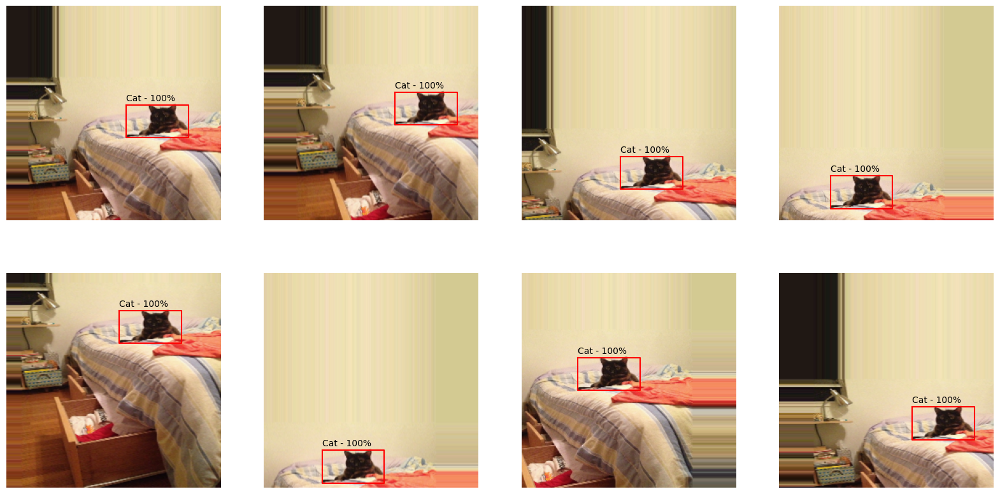

In [103]:
# on va afficher 8 images pour observer les changements
plt.figure(figsize=(20, 10))
for j in range(8):
    plt.subplot(2,4,j+1)
    tf_im, tf_y = load_image(test_img_url, test_y)
    tf_im, tf_y = tf.py_function(f_translation, [tf_im, tf_y], [tf.float32, tf.float32])
    show_bounding_box(tf_im, tf_y)
    plt.xticks([])
    plt.yticks([])

Idem pour la rotation. Pour conserver des bboxes correctes, nous ne ferons que des rotations de 0, 90, 180 et 270°.

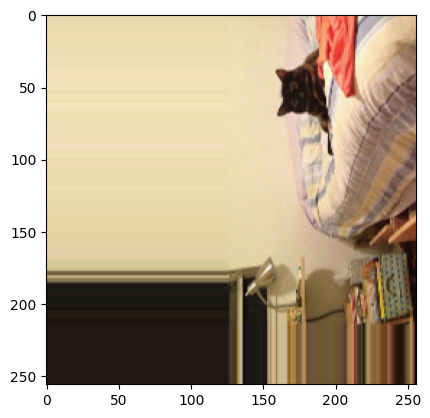

In [104]:
# exemple de rotation
_res_im = tf.keras.preprocessing.image.apply_affine_transform(
        tf_im.numpy(), theta=90, tx=0, ty=0, shear=0, zx=1, zy=1, row_axis=0, 
        col_axis=1, channel_axis=2, fill_mode='nearest', cval=0.0, order=1
    )
plt.imshow(_res_im.astype(int));

La rotation s'effectue dans le sens trigonométrique.

Définition des fonctions de rotation des centres et des longueur/largeurs :

In [105]:
def rotate_xy(tf_xy, theta, radiant=False):
    """Rotation des points d'un angle theta"""
    if not radiant:
        theta *= np.pi/180
    rotation_matrix = np.array(
        [[np.cos(theta), -np.sin(theta)],  
         [np.sin(theta),  np.cos(theta)]],
        dtype=np.float32)
    return np.matmul(tf_xy, rotation_matrix)

def rotate_wh(tf_wh, theta, radiant=False):
    """Rotation des longueurs et largeur du rectangle d'un angle theta"""
    if not radiant:
        theta *= np.pi/180
    rotation_matrix = np.array(
        [[np.cos(theta)**2, np.sin(theta)**2],  
         [np.sin(theta)**2, np.cos(theta)**2]],
        dtype=np.float32)
    return np.matmul(tf_wh, rotation_matrix)

In [106]:
def f_rotation(tf_im, tf_y, resize=resize, detection_limit=0.75, 
               output_shape=output_shape, nb_classes=nb_classes):
    """
    Applique une rotation aléatoire à l'image de 0, 90, 180 ou 270°
    retourne l'image et sa matrice résultat modifiées.
    
    utilise rotate_xy() et rotate_wh()
    """
    # test si l'entrée tf_y est un tenseur:
    if tf.is_tensor(tf_y):
        tf_y = tf_y.numpy().copy()

    np_abs_bboxes = f_coord_rel2abs(  # récupère les coordonnées absolues
            f_pred2relcoord(tf_y, detection_limit=detection_limit, output_shape=output_shape),
            resize=resize
    )  # on x, y, w, h, proba, classe
    # extraction des coordonnées :
    np_xy = np_abs_bboxes[:, 0:2]
    np_wh = np_abs_bboxes[:, 2:4]
    
    # calcul des coordonnées du centre :
    np_xyc = np_xy + np_wh/2

    # centre de l'image :
    origine = np.array([resize[1], resize[0]], dtype=np.float32)/2
    # centre des bbox relatif au centre de l'image
    np_xyc_rel = np_xyc - origine

    # rotation aléatoire
    theta = np.random.choice([0, 90, 180, 270])
    # applique la rotation à l'image
    tf_im = tf.keras.preprocessing.image.apply_affine_transform(
        tf_im.numpy(), theta=theta, tx=0, ty=0, shear=0, zx=1, zy=1, row_axis=0, 
        col_axis=1, channel_axis=2, fill_mode='nearest', cval=0.0, order=1
    )  # NB : les translations passées sont apliquées dans le "sens inverse"

    # applique les rotations
    np_xyc_rel = rotate_xy(np_xyc_rel, theta)
    np_wh = rotate_wh(np_wh, theta)

    # recalcul des coordonnées :
    np_xyc = np_xyc_rel + origine
    np_xy = np_xyc - np_wh/2

    # concaténation
    np_abs_bboxes[:, 0:2] = np_xy
    np_abs_bboxes[:, 2:4] = np_wh

    # traduction en matrice des résultats
    tf_y = f_relcoord2pred(
        f_coord_abs2rel(np_abs_bboxes, resize=resize), 
        output_shape=output_shape,
        nb_classes=nb_classes
    )
    
    return tf_im, tf_y

In [107]:
n = 1445
test_img_url = X_train_path[n]  # url de l'image
test_y = y_train[n]  # matrice des résultats associée

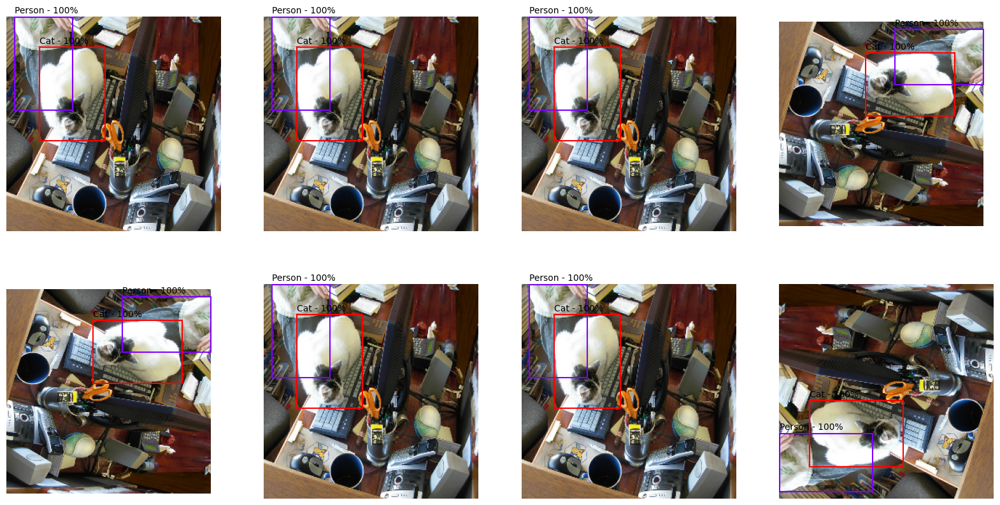

In [108]:
# on va afficher 8 images pour observer les changements
tf_im, tf_y = load_image(test_img_url, test_y)
plt.figure(figsize=(20, 10))
for j in range(8):
    plt.subplot(2,4,j+1)
    tf_im, tf_y = tf.py_function(f_rotation, [tf_im, tf_y], [tf.float32, tf.float32])
    show_bounding_box(tf_im, tf_y)
    plt.xticks([])
    plt.yticks([])

Pour éviter un biais lié aux couleurs, nous appliquerons également un grayscale à certaines images.

In [109]:
from skimage import color

def f_grayscale(tf_im):
    """
    Retourne l'image en échelle de gris à 3 cannaux.
    """
    # test si l'entrée tf_y est un tenseur:
    if tf.is_tensor(tf_im):
        tf_im = tf_im.numpy().copy()
    
    # grayscale aléatoire
    is_grayscale = np.random.randint(0, 2)
    # applique le grayscale
    if is_grayscale:
        tf_im = color.gray2rgb(color.rgb2gray(tf_im))

    return tf_im

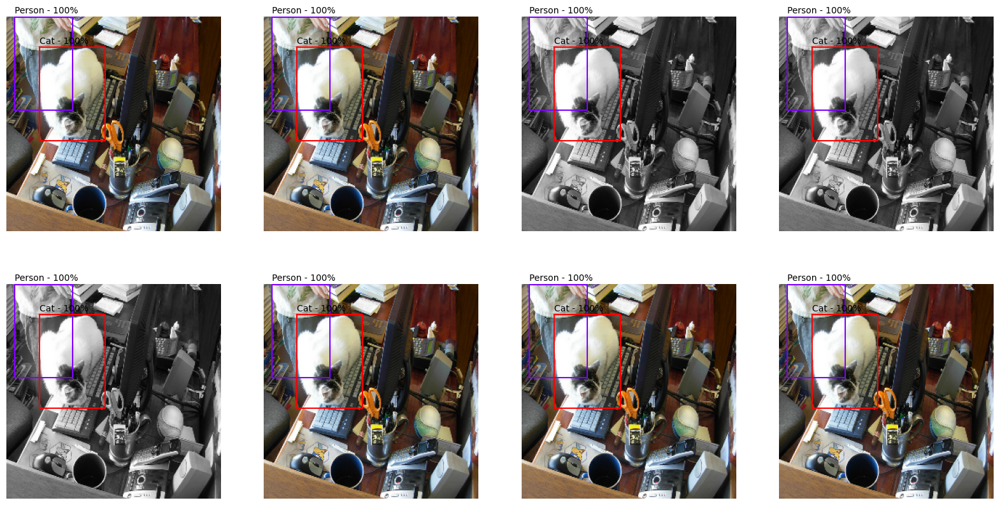

In [110]:
# on va afficher 8 images pour observer les changements
tf_im, tf_y = load_image(test_img_url, test_y)
plt.figure(figsize=(20, 10))
for j in range(8):
    plt.subplot(2,4,j+1)
    show_bounding_box(tf.py_function(f_grayscale, [tf_im], [tf.float32])[0], tf_y)
    plt.xticks([])
    plt.yticks([])

On peut maintenant concaténer les différentes augmentations.

In [111]:
import requests

def load_aug_img_url(tf_img_url, tf_y, resize=resize, detection_limit=0.75, 
                     output_shape=output_shape, nb_classes=nb_classes):
    """
    Permet de charger une image à partir de son url et de la tranformer, elle et
    sa matrice des résultats, en tenseurs. Applique un redimensionnement si besoin.
    
    """
    # ==========
    # CHARGEMENT
    # ==========
    tf_im = tf.image.decode_jpeg(  # charge et décode l'image
        requests.get(tf.compat.as_str_any(tf_img_url.numpy())).content, 
        channels=3, 
        name="jpeg_reader")
    tf_im = tf.image.resize(tf_im, resize) # redimensionne l'image


    # ======================
    # Extraction coordonnées
    # ======================
    # test si tf_im est un tenseur:
    if tf.is_tensor(tf_y):
        tf_y = tf_y.numpy().copy()
    
    np_abs_bboxes = f_coord_rel2abs(
        f_pred2relcoord(tf_y, detection_limit=detection_limit, output_shape=output_shape),
        resize=resize
    )
    

    # =========
    # Grayscale
    # =========
    tf_im = f_grayscale(tf_im)
    

    # ========
    # Rotation
    # ========
    # centre de l'image :
    origine = np.array([resize[1], resize[0]], dtype=np.float32)/2
    # centre des bbox relatif au centre de l'image
    np_xyc_rel = np_abs_bboxes[:, 0:2] + np_abs_bboxes[:, 2:4]/2 - origine

    # rotation aléatoire
    theta = np.random.choice([0, 90, 180, 270])
    # test si tf_im est un tenseur:
    if tf.is_tensor(tf_im):
        tf_im = tf_im.numpy().copy()
    # applique la rotation à l'image
    tf_im = tf.keras.preprocessing.image.apply_affine_transform(
        tf_im, theta=theta, tx=0, ty=0, shear=0, zx=1, zy=1, row_axis=0, 
        col_axis=1, channel_axis=2, fill_mode='nearest', cval=0.0, order=1
    )  # NB : les translations passées sont apliquées dans le "sens inverse"

    # applique les rotations
    np_xyc_rel = rotate_xy(np_xyc_rel, theta)
    np_abs_bboxes[:, 2:4] = rotate_wh(np_abs_bboxes[:, 2:4], theta)

    # recalcul des coordonnées :
    np_abs_bboxes[:, 0:2] = np_xyc_rel + origine - np_abs_bboxes[:, 2:4]/2

    
    # ===========
    # Translation
    # ===========
    # sauvegarde de l'image et des prédictions
    tf_im_save = tf_im
    np_abs_bboxes_save = np_abs_bboxes

    # coordonnées de la bbox englobante :
    xmin, ymin, xmax, ymax = f_bbox_minmax(f_2point_coords(np_abs_bboxes))    
    # limites de translation :
    tx_max = - (resize[1] - xmax)
    tx_min = xmin
    ty_max = - (resize[1] - ymax)
    ty_min = ymin
    # translation aléatoire
    tx = np.random.uniform(tx_min, tx_max)
    ty = np.random.uniform(ty_min, ty_max)
    # test si tf_im est un tenseur:
    if tf.is_tensor(tf_im):
        tf_im = tf_im.numpy().copy()
    # applique la translation à l'image
    tf_im = tf.keras.preprocessing.image.apply_affine_transform(
        tf_im, theta=0, tx=tx, ty=ty, shear=0, zx=1, zy=1, row_axis=0, 
        col_axis=1, channel_axis=2, fill_mode='nearest', cval=0.0, order=1
    )  # NB : les translations passées sont apliquées dans le "sens inverse"
    # modifie les coordonnées de la matrice des résultats
    np_abs_bboxes[:, 0] -= tx
    np_abs_bboxes[:, 1] -= ty

    # si la translation donne une image avec plusieurs centres dans une cellule
    if f_ismulticenter(np_abs_bboxes, output_shape=output_shape):
        np_abs_bboxes = np_abs_bboxes_save
        tf_im = tf_im_save


    # ============================
    # reconversion des coordonnées
    # ============================
    tf_y = f_relcoord2pred(
        f_coord_abs2rel(np_abs_bboxes, resize=resize), 
        output_shape=output_shape, nb_classes = nb_classes
    )

    return tf_im, tf_y

Pour charger une image à partir d'un fichier local

In [112]:
def load_aug_img(tf_img_path, tf_y, resize=resize, detection_limit=0.75, 
                 output_shape=output_shape, nb_classes=nb_classes):
    """
    Permet de charger une image à partir de son url et de la tranformer, elle et
    sa matrice des résultats, en tenseurs. Applique un redimensionnement si besoin.
    
    """
    # ==========
    # CHARGEMENT
    # ==========
    tf_im = tf.io.read_file(tf_img_path)
    tf_im = tf.image.decode_jpeg(  # charge et décode l'image
        tf_im, 
        channels=3, 
        name="jpeg_reader")
    tf_im = tf.image.resize(tf_im, resize) # redimensionne l'image


    # ======================
    # Extraction coordonnées
    # ======================
    # test si tf_im est un tenseur:
    if tf.is_tensor(tf_y):
        tf_y = tf_y.numpy().copy()
    
    np_abs_bboxes = f_coord_rel2abs(
        f_pred2relcoord(tf_y, detection_limit=detection_limit, output_shape=output_shape),
        resize=resize
    )
    

    # =========
    # Grayscale
    # =========
    tf_im = f_grayscale(tf_im)
    

    # ========
    # Rotation
    # ========
    # centre de l'image :
    origine = np.array([resize[1], resize[0]], dtype=np.float32)/2
    # centre des bbox relatif au centre de l'image
    np_xyc_rel = np_abs_bboxes[:, 0:2] + np_abs_bboxes[:, 2:4]/2 - origine

    # rotation aléatoire
    theta = np.random.choice([0, 90, 180, 270])
    # test si tf_im est un tenseur:
    if tf.is_tensor(tf_im):
        tf_im = tf_im.numpy().copy()
    # applique la rotation à l'image
    tf_im = tf.keras.preprocessing.image.apply_affine_transform(
        tf_im, theta=theta, tx=0, ty=0, shear=0, zx=1, zy=1, row_axis=0, 
        col_axis=1, channel_axis=2, fill_mode='nearest', cval=0.0, order=1
    )  # NB : les translations passées sont apliquées dans le "sens inverse"

    # applique les rotations
    np_xyc_rel = rotate_xy(np_xyc_rel, theta)
    np_abs_bboxes[:, 2:4] = rotate_wh(np_abs_bboxes[:, 2:4], theta)

    # recalcul des coordonnées :
    np_abs_bboxes[:, 0:2] = np_xyc_rel + origine - np_abs_bboxes[:, 2:4]/2

    
    # ===========
    # Translation
    # ===========
    # sauvegarde de l'image et des prédictions
    tf_im_save = tf_im
    np_abs_bboxes_save = np_abs_bboxes

    # coordonnées de la bbox englobante :
    xmin, ymin, xmax, ymax = f_bbox_minmax(f_2point_coords(np_abs_bboxes))    
    # limites de translation :
    tx_max = - (resize[1] - xmax)
    tx_min = xmin
    ty_max = - (resize[1] - ymax)
    ty_min = ymin
    # translation aléatoire
    tx = np.random.uniform(tx_min, tx_max)
    ty = np.random.uniform(ty_min, ty_max)
    # test si tf_im est un tenseur:
    if tf.is_tensor(tf_im):
        tf_im = tf_im.numpy().copy()
    # applique la translation à l'image
    tf_im = tf.keras.preprocessing.image.apply_affine_transform(
        tf_im, theta=0, tx=tx, ty=ty, shear=0, zx=1, zy=1, row_axis=0, 
        col_axis=1, channel_axis=2, fill_mode='nearest', cval=0.0, order=1
    )  # NB : les translations passées sont apliquées dans le "sens inverse"
    # modifie les coordonnées de la matrice des résultats
    np_abs_bboxes[:, 0] -= tx
    np_abs_bboxes[:, 1] -= ty

    # si la translation donne une image avec plusieurs centres dans une cellule
    if f_ismulticenter(np_abs_bboxes, output_shape=output_shape):
        np_abs_bboxes = np_abs_bboxes_save
        tf_im = tf_im_save


    # ============================
    # reconversion des coordonnées
    # ============================
    tf_y = f_relcoord2pred(
        f_coord_abs2rel(np_abs_bboxes, resize=resize), 
        output_shape=output_shape, nb_classes = nb_classes
    )

    return tf_im, tf_y

In [113]:
from sklearn.model_selection import train_test_split

X_train_path, X_test_path, y_train, y_test = train_test_split(
    df_dataset_path.img_path.values, 
    np.asarray(df_dataset_path.img_y.to_list()),  # pour transformer y en array (car array d'array)
    train_size=0.9)

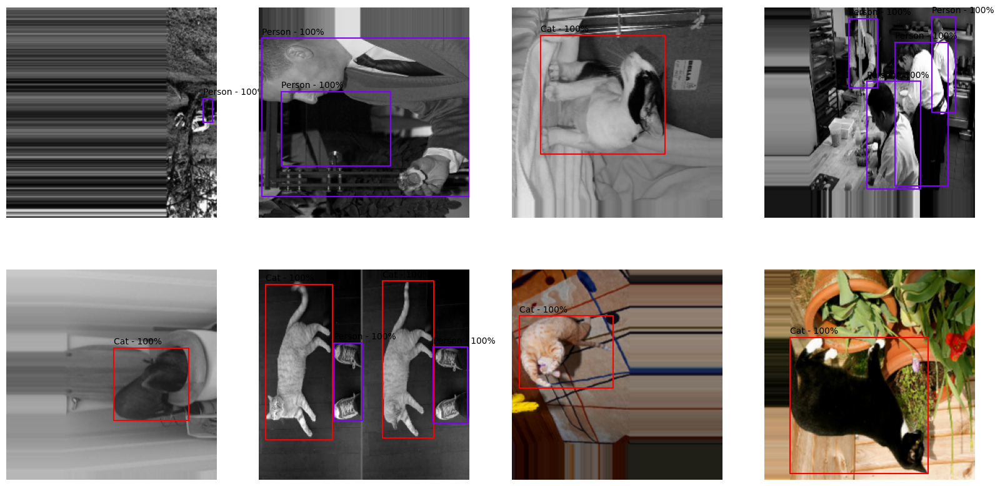

In [114]:
# test
nbimg = 8
plt.figure(figsize=(20, 5*nbimg//4))
for j in range(nbimg):
    plt.subplot(nbimg//4,4,j+1)
    n = np.random.randint(0, len(X_train_path))
    test_img_url = X_train_path[n]  # url de l'image
    test_y = y_train[n]  # matrice des résultats associée
    tf_y = tf.constant(test_y, dtype=tf.float32)  # transforme l'output en tenseur
    tf_im, tf_y = tf.py_function(load_aug_img, [test_img_url, tf_y], [tf.float32, tf.float32])
    show_bounding_box(tf_im, tf_y)
    plt.xticks([])
    plt.yticks([])

On pourrait également effectuer d'autres traitements d'image.

### <a name="IV.3"></a>IV.3 - Générateurs

On redéfini les constantes pour être sûr.

In [115]:
resize = (256, 256)
detection_limit = 0.75
output_shape = (NB_CELLS_H, NB_CELLS_W)
nb_classes = len(list_classes)
batch_size = 64

Séparation données d'entraînement et de test :

In [116]:
from sklearn.model_selection import train_test_split

X_train_path, X_test_path, y_train, y_test = train_test_split(
    df_dataset_path.img_path.values, 
    np.asarray(df_dataset_path.img_y.to_list()),  # pour transformer y en array (car array d'array)
    train_size=0.9)

Générateur d'entraînement :

In [117]:
dataset_train = tf.data.Dataset.from_tensor_slices((X_train_path, y_train))
dataset_train = dataset_train.shuffle(100000).map(lambda x, y : tf.py_function(load_aug_img, [x, y], [tf.float32, tf.float32]), num_parallel_calls=-1).batch(int(batch_size))

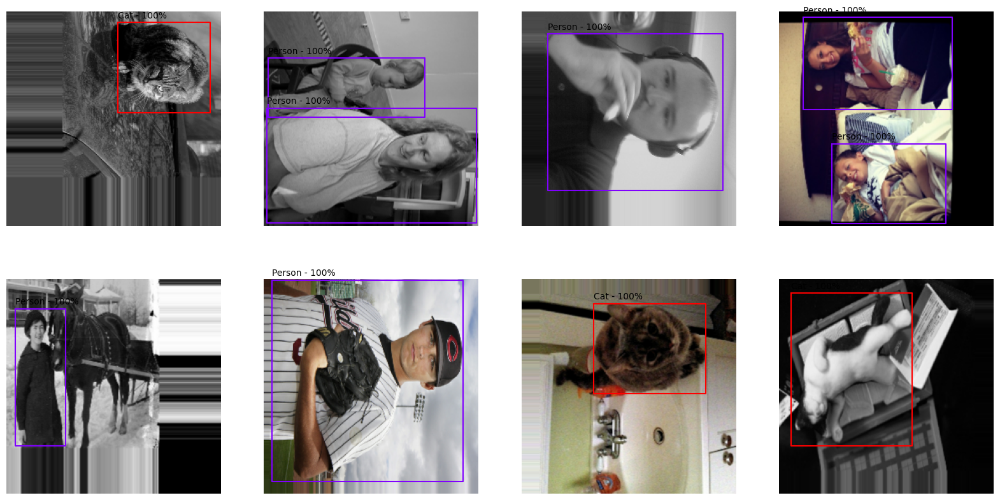

In [118]:
# test du générateur
X_t, y_t = next(iter(dataset_train))
nbimg = 8
plt.figure(figsize=(20, 5*nbimg//4))
for j, i in zip(range(nbimg), np.random.randint(0, batch_size, [nbimg])):
    plt.subplot(nbimg//4,4,j+1)
    show_bounding_box(X_t[i], y_t[i])
    plt.xticks([])
    plt.yticks([])

Le générateur d'entraînement fonctionne, nous allons maintenant définir un modèle de test. 

In [119]:
def load_img(tf_img_path, tf_y, resize=resize):
    """
    Permet de charger une image à partir de son path. 
    Applique un redimensionnement si besoin.
    
    """
    # ==========
    # CHARGEMENT
    # ==========
    tf_im = tf.io.read_file(tf_img_path)
    tf_im = tf.image.decode_jpeg(  # charge et décode l'image
        tf_im, 
        channels=3, 
        name="jpeg_reader")
    tf_im = tf.image.resize(tf_im, resize) # redimensionne l'image

    return tf_im, tf_y

In [120]:
dataset_test = tf.data.Dataset.from_tensor_slices((X_test_path, y_test))
dataset_test = dataset_test.shuffle(100000).map(lambda x, y : tf.py_function(load_img, [x, y], [tf.float32, tf.float32]), num_parallel_calls=-1).batch(int(batch_size))

### <a name="IV.4"></a>IV.4 - Modèle de test (EfficientNet TL)

Nous allons définir un modèle de test, en utilisant une backbone EfficientNet. Nous testerons, plus tard, différents modèles, l'objectif étant d'obtenir un modèle rapide, peu gourmant en ressources et le plus précis possible.

In [121]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Conv2D, LeakyReLU, Dropout, Reshape, BatchNormalization
from tensorflow.keras import Sequential

# infos du modèle
model_name = "Moustik-CAM_EfficientNet-test04"
fine_tuning = True


# Backbone
efficientNet = EfficientNetB0(
    include_top=False, 
    input_shape=(*resize, 3),
    weights='imagenet', 
    #pooling='avg'
)

# Gel de la blackbone
for layer in efficientNet.layers:
    layer.trainable = False

# Définition de la partie encoder
model = Sequential()
# Partie extraction de features
model.add(efficientNet) 
model.add(Reshape([-1, 1280]))
# Partie régression
model.add(Dense(1024, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(5 + nb_classes))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional)  (None, 8, 8, 1280)       4049571   
                                                                 
 reshape (Reshape)           (None, 64, 1280)          0         
                                                                 
 dense (Dense)               (None, 64, 1024)          1311744   
                                                                 
 dropout (Dropout)           (None, 64, 1024)          0         
                                                                 
 dense_1 (Dense)             (None, 64, 512)           524800    
                                                                 
 dropout_1 (Dropout)         (None, 64, 512)           0         
                                                                 
 dense_2 (Dense)             (None, 64, 256)           1

Il nous faudra transformer la sortie de notre modèle en matrice 64 x 7 avec, par ligne, une cellule de la grille, et par colonne : proba, xc_rel, yc_rel, w_rel, h_rel, class1, class2 ...

In [122]:
# Fonction de sortie
def transform_netout(y_pred_raw, nb_classes=nb_classes):
    """
    Fonction de sortie de notre modèle.
    Utilise une fonction sigmoid pour prédire la probabilité de présence d'un objet
    Utilise une fonction sigmoid pour le couple (x, y) centre de la bbox p/r à la cellule
    Utilise une fonction sigmoid pour le couple (w, h) dimension de la bbox p/r à l'image
    Utilise une fonction sigmoid pour les classes
    """
    y_pred_conf = tf.nn.sigmoid(y_pred_raw[..., :1])
    y_pred_xy = tf.nn.sigmoid(y_pred_raw[..., 1:3])
    y_pred_wh = tf.nn.sigmoid(y_pred_raw[..., 3:5])
    if nb_classes:
        y_pred_class = tf.nn.softmax(y_pred_raw[..., 5:])
        res = tf.concat([y_pred_conf, y_pred_xy, y_pred_wh, y_pred_class], -1)
    else:
        res = tf.concat([y_pred_conf, y_pred_xy, y_pred_wh], -1)
    return res

### <a name="IV.5"></a>IV.5 - Fonction de perte

Pour tester nos fonctions, nous allons prédire les résultats à partir de `X_t`, transformer le résultat et le stocker dans `y_pred`.

In [123]:
y_pred_raw = model.predict(X_t)  # prédiction
y_pred = transform_netout(y_pred_raw)  # traduction

2/2 [==============================] - 5s 21ms/step


La fonction de perte de l'algorithme doit comprendre 3 grandes parties :

- l'erreur de classification : classe de la bounding box

- l'erreur de localisation : localisation de la bounding box

- l'erreur de confiance : présence ou non d'un objet

L'erreur de classification est relativement simple, elle correspond à une erreur quadratique moyenne appliquée uniquement aux grilles où se trouvent les vrais objets.
>$$ \mathscr{L}_{class} = \sum_{i=0}^{S²} \mathbb{1}_i^{obj} \sum_{c \in classes} (p_i(c) - \hat{p}_i(c))^2  $$
>
>
> Avec :
>
>* $\mathbb{1}_i^{obj} = 1$ si un objet est présent dans la cellule $i$, sinon 0.
>
>
>* $\hat{p}_i(c)$ correspond à la prédiction de la probabilité conditionnelle ($P(y=c|X)$) pour la classe $c$ de la cellule $i$.

In [124]:
def class_loss(y_true, y_pred):
    # Proba de présence des vrais objets
    y_true_conf = y_true[..., 0]
    # Probabilité conditionelle des vrais objets
    y_true_class = y_true[..., 5:]
    # Probabilité conditionelle des prédictions
    y_pred_class = y_pred[..., 5:]
    # Calcul de la fonction de perte
    class_loss = tf.reduce_sum(
        y_true_conf * tf.reduce_sum(tf.square(y_true_class - y_pred_class), axis=-1), 
        axis=-1)
    return class_loss

In [125]:
# test avec X_t
class_loss(y_t, y_pred)

<tf.Tensor: shape=(64,), dtype=float32, numpy=
array([5.9702438e-01, 2.2241910e+00, 7.4275255e-01, 1.0880392e+00,
       8.2633483e-01, 5.1509404e-01, 8.7227261e-01, 4.5192271e-01,
       9.1827512e-01, 3.8932837e-03, 1.4002819e+00, 1.0037107e+00,
       6.6891968e-01, 2.9097140e-01, 2.9897785e-02, 5.0001729e-01,
       8.4377962e-01, 1.3265114e+00, 5.2347195e-01, 5.9340245e-01,
       1.5916139e+00, 5.8605868e-01, 5.1418400e-01, 1.9474998e-01,
       4.3532053e-01, 5.2152199e-01, 1.2237827e+00, 2.9280753e-04,
       1.5471722e+00, 9.0195732e-03, 1.7756978e+00, 8.9882517e-01,
       2.3013372e-02, 1.1013181e+00, 8.8393307e-01, 5.5086400e-02,
       6.6217417e-03, 7.5300682e-01, 1.5361307e+00, 7.6296514e-01,
       5.8497146e-02, 1.0703874e+00, 9.6470869e-01, 5.0521737e-01,
       5.3674716e-01, 2.0520840e+00, 2.3822293e+00, 1.9235992e-01,
       3.3656247e+00, 1.0287964e+00, 1.1959032e+00, 2.2366405e+00,
       5.3422862e-01, 2.7721290e-02, 1.3625795e+00, 1.0926005e+00,
       1.039697

L'erreur de localisation mesure l'erreur sur les coordonnées de la bbox. Elle ne peut être calculée que sur les cellules contenant un objet.
>$$ \mathscr{L}_{localisation} =  \sum_{i=0}^{S²} \mathbb{1}_i^{obj} [(x_i - \hat{x}_i)^2 + (y_i - \hat{y}_i)^2 + (\sqrt{w_i} - \sqrt{\hat{w}_i})^2 + (\sqrt{h_i} - \sqrt{\hat{h}_i})^2] $$
>
>
> Avec :
>
>* $\mathbb{1}_i^{obj} = 1$ si un objet est présent dans la cellule $i$, sinon 0.
>
>
>* $\hat{x}_i$, $\hat{y}_i$, $\hat{w}_i$ et $\hat{h}_i$  correspondant à la prédiction des coordonnées de la bounding box se trouvant dans la cellule $i$.

In [126]:
def coord_loss(y_true, y_pred):
    # Proba de présence des vrais objets
    y_true_conf = y_true[..., 0]
    
    # Perte sur x et y pour des vrais objets
    y_true_xy = y_true[..., 1:3]
    y_pred_xy = y_pred[..., 1:3]
    xy_loss = tf.reduce_sum(
        y_true_conf * tf.reduce_sum(tf.square(y_true_xy - y_pred_xy),axis=-1), 
        axis=-1)
    
    # Perte sur w et h pour des vrais objets
    y_true_wh = y_true[..., 3:5]
    y_pred_wh = y_pred[..., 3:5]
    wh_loss = tf.reduce_sum(
        y_true_conf * tf.reduce_sum(tf.square(tf.sqrt(y_true_wh) - tf.sqrt(y_pred_wh)), axis=-1), 
        axis=-1)

    return xy_loss + wh_loss

In [127]:
# test sur X_t
coord_loss(y_t, y_pred)

<tf.Tensor: shape=(64,), dtype=float32, numpy=
array([0.3055411 , 2.5798085 , 0.4373027 , 0.8420285 , 0.77086437,
       0.2167651 , 0.72569764, 0.08539585, 0.898332  , 0.7571676 ,
       0.49770603, 0.6087637 , 0.34890512, 0.63380945, 0.10266249,
       0.5183972 , 0.80460024, 0.56221604, 0.2540231 , 0.30433077,
       1.4746912 , 0.07862919, 0.08864185, 0.11004537, 0.49042928,
       0.37953073, 1.0870868 , 0.60579884, 1.1123776 , 0.24667193,
       0.9682503 , 0.17815189, 0.50131947, 1.8247654 , 0.05637925,
       0.08344565, 0.11019848, 0.5024236 , 2.7619648 , 0.55933326,
       0.31145823, 1.8256238 , 0.32805985, 0.49222615, 0.4757077 ,
       2.4024994 , 0.7965574 , 0.31035233, 1.7234701 , 0.0842339 ,
       1.0479445 , 1.0984569 , 0.53206027, 0.18348879, 1.4116352 ,
       1.1298072 , 1.7865566 , 1.8134452 , 0.87166274, 1.4459755 ,
       0.4987939 , 0.48662755, 0.23355222, 0.18357536], dtype=float32)>

L'erreur sur la présence d'objet mesure l'erreur sur la présence d'un object dans une cellule. Dans l'algorithme Yolo, un facteur $\lambda_{object}$ est appliqué pour pondérer l'erreur de la partie non objet.


>$$ \mathscr{L}_{object} = \sum_{i=0}^{S²} [\mathbb{1}_i^{obj} (p_i - \hat{p}_i)^2 + \lambda_{noobj} (1-\mathbb{1}_i^{obj}) \cdot (p_i - \hat{p}_i)^2] $$
>
>$$ \mathscr{L}_{object} = \sum_{i=0}^{S²} (\lambda_{noobj} + (1- \lambda_{noobj})\mathbb{1}_i^{obj})\cdot (p_i - \hat{p}_i)^2 $$
>
> Avec :
>
>* $\mathbb{1}_i^{obj} = 1$ si un objet est présent dans la cellule $i$, sinon 0.
>
>
>* $\hat{x}_i$, $\hat{y}_i$, $\hat{w}_i$ et $\hat{h}_i$  correspondant à la prédiction des coordonnées de la bounding box se trouvant dans la cellule $i$.
>
>
>* Avec $\lambda_{object}$ la pondération sur l'erreur de la partie non objet.

In [128]:
def object_loss(y_true, y_pred, lambda_noobj=0.5):
    # x and y loss for real object
    y_true_p = y_true[..., 0]
    y_pred_p = y_pred[..., 0]
    return tf.reduce_sum(
        (lambda_noobj + (1 - lambda_noobj) * y_true_p) * tf.square(y_true_p - y_pred_p), 
        axis=-1)

In [129]:
# test sur X_t
object_loss(y_t, y_pred)

<tf.Tensor: shape=(64,), dtype=float32, numpy=
array([4.2638645, 7.2257366, 5.316393 , 5.411257 , 4.7377915, 4.6544256,
       6.755948 , 5.434654 , 6.085863 , 5.3805885, 6.1372166, 5.0340004,
       5.340454 , 7.28928  , 5.2365904, 6.2298656, 5.3635015, 5.598451 ,
       5.5472255, 4.398461 , 5.6448827, 6.018573 , 4.8211384, 5.3433714,
       4.5731983, 5.0109835, 6.233581 , 6.282682 , 5.3749347, 5.118166 ,
       5.5447817, 4.705365 , 5.78745  , 5.558674 , 4.201348 , 6.50305  ,
       5.410178 , 5.4086065, 5.686201 , 5.533977 , 5.1360693, 6.2221446,
       5.3180757, 4.5924063, 5.2111206, 6.6688347, 7.0186443, 5.816571 ,
       5.7997694, 4.8609943, 5.9095573, 5.8126745, 5.9659367, 5.260066 ,
       4.9935713, 4.9515066, 4.9164925, 5.1258044, 5.942475 , 5.3510013,
       5.404916 , 4.777404 , 5.7452765, 4.4238605], dtype=float32)>

Cette fonction de perte a quelques limitations, en effet, elle considère que toutes cases ne contenant pas de vrais objets sont considérées comme des non objets.

**Erreur globale**

Ici, la fonction de perte globale comprendra l'erreur de classification, l'erreur de localisation ainsi que l'erreur de présence d'objet. 


> $$ \mathscr{L}_{total} = \lambda_{class} \cdot \mathscr{L}_{class} + \lambda_{coord} \cdot \mathscr{L}_{localisation}  + \lambda_{object} \cdot \mathscr{L}_{object} $$
>
> Avec $\lambda_{class}$, $\lambda_{coord}$ et $\lambda_{object}$ les pondérations respectives sur la partie classification, la partie localisation et la partie objet.

In [130]:
def global_loss(y_true, y_pred, lambda_class=1, lambda_coord=5, lambda_object=1):
    # traduction de l'input
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    y_pred = transform_netout(y_pred)
    # calcul des fonctions de perte
    loss_class = class_loss(y_true, y_pred)
    loss_coordinate = coord_loss(y_true, y_pred)
    loss_object = object_loss(y_true, y_pred)
    # calcul de l'erreur globale
    return lambda_class * loss_class + lambda_object * loss_object + lambda_coord * loss_coordinate

In [131]:
# Erreur globale sur X_t
global_loss(y_t, y_pred)

<tf.Tensor: shape=(64,), dtype=float32, numpy=
array([12.16983  , 25.554169 , 13.810423 , 15.454773 , 12.435013 ,
       12.47281  , 15.581082 , 12.274902 , 15.424193 , 13.698061 ,
       15.624162 , 14.6443   , 13.782402 , 15.043514 , 11.9022045,
       14.428305 , 15.935664 , 15.600056 , 12.786833 , 13.31934  ,
       19.669046 , 12.192127 , 11.970871 , 12.598959 , 16.178257 ,
       13.958632 , 15.843068 , 13.506074 , 19.94582  , 12.236469 ,
       18.183586 , 11.832503 , 14.564292 , 17.505651 , 11.549157 ,
       13.21301  , 11.673556 , 14.060491 , 28.233528 , 12.758615 ,
       13.216962 , 21.49461  , 12.81516  , 14.049618 , 12.911619 ,
       23.015694 , 20.120827 , 12.678691 , 23.76028  , 11.906743 ,
       16.343512 , 19.27011  , 14.402514 , 11.755314 , 17.612787 ,
       16.713497 , 20.504969 , 23.07073  , 16.985111 , 19.444057 ,
       12.742556 , 12.381249 , 12.430685 , 12.619802 ], dtype=float32)>

### <a name="IV.6"></a>IV.6 - Callbacks

In [132]:
from tensorflow.keras import callbacks

# Sauvegarde les poids automatiquement
checkpoint = callbacks.ModelCheckpoint(
    filepath='model', 
    monitor='val_loss',
    save_best_only=True,
    save_weights_only=True,
    mode='min',
    save_freq='epoch')

# Réduction automatique du learning rate
lr_plateau = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    patience=4,
    factor=0.1,
    verbose=2,
    min_delta=0.01,
    mode='min')

# Arrêt automatique
earlystop = callbacks.EarlyStopping(
    monitor='val_loss',
    min_delta=0.01,
    patience=8,
    mode='min',
    verbose=1,
    restore_best_weights=True)

# Pour enregistrer le log d'entraînement du modèle
csv_logger = callbacks.CSVLogger(  
    model_name + '_training.log', 
    separator=',', 
    append=False)
#model_history = pd.read_csv(model_name + '_training.log', sep=',', engine='python')  # pour recharger, s'utilise comme un keras.history

### <a name="IV.7"></a>IV.7 - Entraînement

Compilation

TODO : créer des metrics ?

In [133]:
from tensorflow.keras.optimizers import Adam

model.compile(optimizer=Adam(1e-3), loss=global_loss)

Entraînement

In [134]:
model_history = model.fit(
    dataset_train, 
    epochs=70,
    validation_data=dataset_test,
    workers=-1,  
    callbacks=[lr_plateau, checkpoint, earlystop, csv_logger]
)

Epoch 1/70
130/130 [==============================] - 244s 2s/step - loss: 4.1204 - val_loss: 3.5810 - lr: 0.0010
Epoch 2/70
130/130 [==============================] - 226s 2s/step - loss: 3.5597 - val_loss: 3.4059 - lr: 0.0010
Epoch 3/70
130/130 [==============================] - 220s 2s/step - loss: 3.4785 - val_loss: 3.3062 - lr: 0.0010
Epoch 4/70
130/130 [==============================] - 217s 2s/step - loss: 3.4010 - val_loss: 3.3409 - lr: 0.0010
Epoch 5/70
130/130 [==============================] - 221s 2s/step - loss: 3.3647 - val_loss: 3.3201 - lr: 0.0010
Epoch 6/70
130/130 [==============================] - 222s 2s/step - loss: 3.3646 - val_loss: 3.2684 - lr: 0.0010
Epoch 7/70
130/130 [==============================] - 216s 2s/step - loss: 3.3279 - val_loss: 3.2650 - lr: 0.0010
Epoch 8/70
130/130 [==============================] - 215s 2s/step - loss: 3.3171 - val_loss: 3.2471 - lr: 0.0010
Epoch 9/70
130/130 [==============================] - 216s 2s/step - loss: 3.2973 - val_

In [135]:
# fine tuning
if fine_tuning:
    # Dégel des couches de la backbone
    for layer in efficientNet.layers:
        layer.trainable = True

    # Re-compilation du modèle
    model.compile(optimizer=Adam(1e-4), loss=global_loss)

    # Entraînement
    model_history2 = model.fit(
        dataset_train, 
        epochs=70,
        validation_data=dataset_test,
        workers=-1,  
        callbacks=[lr_plateau, checkpoint, earlystop, csv_logger]
    )

Epoch 1/70
130/130 [==============================] - 373s 2s/step - loss: 3.2456 - val_loss: 3.0227 - lr: 1.0000e-04
Epoch 2/70
130/130 [==============================] - 282s 2s/step - loss: 3.0625 - val_loss: 2.9293 - lr: 1.0000e-04
Epoch 3/70
130/130 [==============================] - 285s 2s/step - loss: 2.9903 - val_loss: 2.8418 - lr: 1.0000e-04
Epoch 4/70
130/130 [==============================] - 286s 2s/step - loss: 2.9031 - val_loss: 2.7810 - lr: 1.0000e-04
Epoch 5/70
130/130 [==============================] - 284s 2s/step - loss: 2.8489 - val_loss: 2.7371 - lr: 1.0000e-04
Epoch 6/70
130/130 [==============================] - 281s 2s/step - loss: 2.8075 - val_loss: 2.6749 - lr: 1.0000e-04
Epoch 7/70
130/130 [==============================] - 283s 2s/step - loss: 2.7386 - val_loss: 2.6399 - lr: 1.0000e-04
Epoch 8/70
130/130 [==============================] - 279s 2s/step - loss: 2.7069 - val_loss: 2.6245 - lr: 1.0000e-04
Epoch 9/70
130/130 [==============================] - 28

Sans fine-tuning, `val_loss` de 3 à 3.2 sur ~ 25 epochs.  
Suivit val_loss en fine-tuning et quelques tests de modification des Callbacks `lr_plateau` et `earlystop` :
- Modèle 1, lr = 1e-5 au début ft, `val_loss` = 2.6074 (52/60 epochs)
- Modèle 2, lr = 1e-4 au début ft, `val_loss` = 2.1368 (46/54 epochs)
- Modèle 3, lr = 1e-3 au début ft, `val_loss` = 1.9698 (23/31 epochs)
- Modèle 4, lr = 1e-4 au début ft, `val_loss` = 2.0449 (19/44 epochs)

Mieux vaut sans doute diminuer les `min_delta` des Callbacks à une valeur inférieure à 0.01 ? Et `restore_best_weights` ne semble pas optimal.

NB : pour le modèle 1, le lr de ft était trop faible et seul un minima local était atteint. Ce plateau était clairement visible sur le graph de fine-tuning des modèles suivants.

### <a name="IV.8"></a>IV.8 - Sauvegarde du modèle

In [ ]:
#model.save(model_name + ".h5")  # sauvegarde

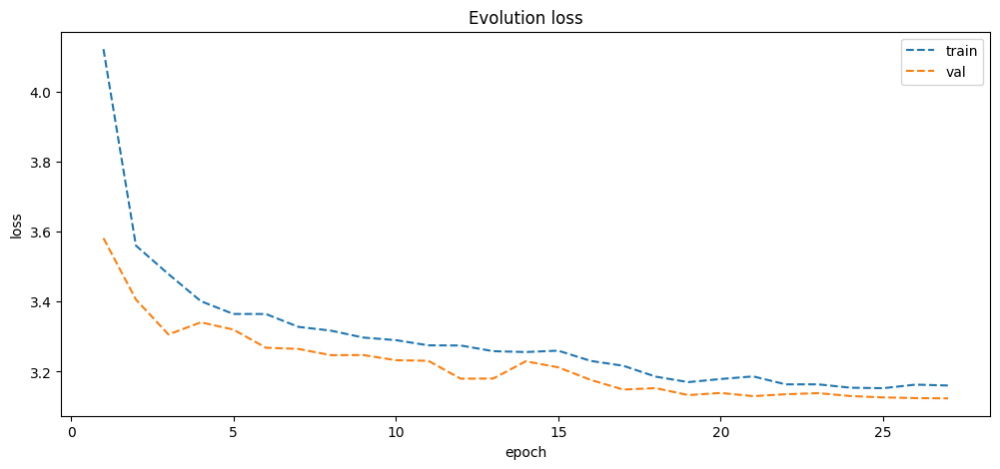

In [155]:
# affichage
if model_history is not None:
    fig, ax = plt.subplots(1, 1, figsize=(12, 5))
    #fig, axs = plt.subplots(1, 1, figsize=(12, 5))

    x = np.arange(1, len(model_history.history['loss']) + 1)
    metric = 'loss'
    #for ax, metric in zip(axs.ravel(), ['loss']):
    ax.set_title("Evolution " + metric)
    ax.plot(x, model_history.history[metric], ls='--', label="train")
    ax.plot(x, model_history.history['val_' + metric], ls='--', label="val")
    ax.set_xlabel("epoch")
    ax.set_ylabel(metric)
    ax.legend()

    plt.show();

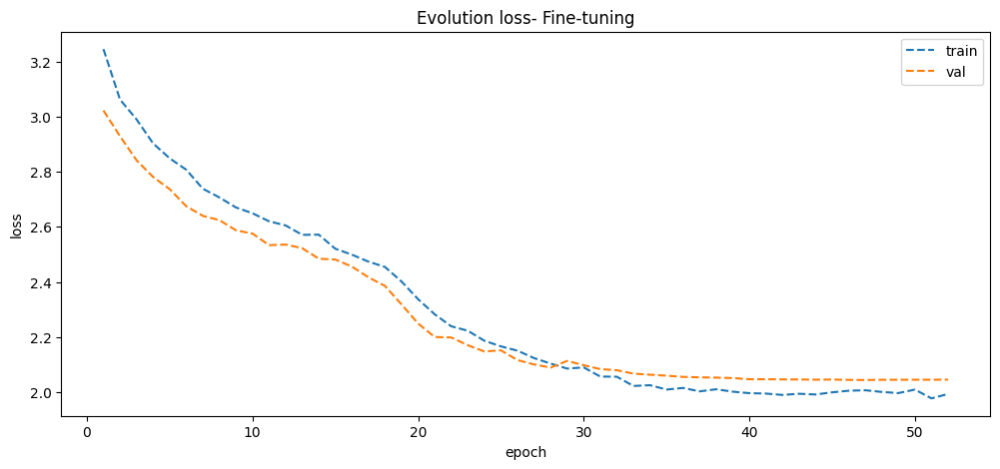

In [156]:
# affichage
if fine_tuning:
    fig, ax = plt.subplots(1, 1, figsize=(12, 5))
    #fig, axs = plt.subplots(1, 1, figsize=(12, 5))

    x = np.arange(1, len(model_history2.history['loss']) + 1)
    metric = 'loss'
    #for ax, metric in zip(axs.ravel(), ['loss']):
    ax.set_title("Evolution " + metric + "- Fine-tuning")
    ax.plot(x, model_history2.history[metric], ls='--', label="train")
    ax.plot(x, model_history2.history['val_' + metric], ls='--', label="val")
    ax.set_xlabel("epoch")
    ax.set_ylabel(metric)
    ax.legend()

    plt.show();

In [157]:
from contextlib import redirect_stdout

# pour sauvegarder le résumé du modèle
with open(model_name + '.txt', 'w') as f:
    with redirect_stdout(f):
        model.summary()

### <a name="IV.9"></a>IV.9 - Test du modèle

In [158]:
def nms(pred, output_shape=output_shape, threshold=0.5, score_threshold=0.05):
    """
    Applique une Non-maximum Suppression (NMS) à la sortie du modèle.
    """

    # Extraire les coordonnées de la bounding box, la confiance et les classes prédites
    confidences = pred[..., :1]
    bbx_wh = pred[..., 3:5]
    
    # tableau des coordonnées des cellules de la grille
    grid_x = tf.range(output_shape[1], dtype=tf.float32)
    grid_y = tf.range(output_shape[0], dtype=tf.float32)
    grid_xy = tf.transpose(tf.stack(tf.meshgrid(grid_x, grid_y, indexing='ij')))
    grid_n_xy = tf.reshape(grid_xy, [-1, 2])
    
    # calcul des coordonnées du centre de la bbox par rapport à l'image et non la cellule de la grille
    bbx_xy = (pred[..., 1:3] + grid_n_xy) / (output_shape[1], output_shape[0])

    # Calculer les coordonnées des coins opposés des bounding boxes
    x1 = bbx_xy[..., 0:1] - bbx_wh[..., 0:1] / 2
    y1 = bbx_xy[..., 1:2] - bbx_wh[..., 1:2] / 2
    x2 = bbx_xy[..., 0:1] + bbx_wh[..., 0:1] / 2
    y2 = bbx_xy[..., 1:2] + bbx_wh[..., 1:2] / 2

    if tf.shape(pred)[-1] >= 6:  # si il y a des classes
        classes = pred[..., 5:]
        list_indices = []
        for c in range(tf.shape(pred)[-1] - 5):
            # on calcule les scores pour la classe class_c
            class_c = classes[..., c:c+1]
            mask = tf.greater_equal(class_c, 0.5)  # prédictions pour cette classe
            scores = confidences * tf.where(mask, class_c, tf.zeros_like(class_c))
            
            list_indices.append(tf.image.non_max_suppression(
                boxes=tf.concat([y1, x1, y2, x2], axis=-1),
                scores=tf.reshape(scores, [-1]),
                max_output_size=tf.shape(scores)[0],
                iou_threshold=threshold,
                score_threshold=score_threshold,
                name=None
            ))
        indices, _ = tf.unique(tf.concat(list_indices, axis=0))
        
    else:
        # applique la NMS (cas pas de classes)
        scores = confidences
        indices = tf.image.non_max_suppression(
            boxes=tf.concat([y1, x1, y2, x2], axis=-1),
            scores=tf.reshape(scores, [-1]),
            max_output_size=tf.shape(scores)[0],
            iou_threshold=threshold,
            score_threshold=score_threshold,
            name=None
        )
    
    # Création du masque pour ne garder que les bounding boxes sélecetionnées
    mask = tf.zeros([output_shape[1] * output_shape[0]], dtype=tf.bool)
    mask = tf.tensor_scatter_nd_update(mask, tf.expand_dims(indices, axis=1), tf.ones_like(indices, dtype=bool))
    # on broadcast la ligne de bouléens sur l'entièreté de la shape du tenseur d'entrée (prendre en compte la taille du batch)
    mask = tf.tile(mask[..., None], [1 if dim != tf.shape(pred)[-1] else dim for dim in tf.shape(pred)])   

    # Remplacer les coordonnées, la confiance et les classes prédites des bounding boxes qui n'ont pas été sélectionnées par des 0
    res = tf.where(mask, pred, tf.zeros_like(pred))

    return res

In [159]:
import requests

def load_image_url(img_url, resize=resize):
    """
    Permet de charger une image à partir de son url et de la tranformer, elle et
    sa matrice des résultats, en tenseurs. Applique un redimensionnement si besoin.
    
    """

    tf_im = tf.image.decode_jpeg(  # charge et décode l'image
        requests.get(img_url).content, 
        channels=3, 
        name="jpeg_reader")
    if resize:
        tf_im = tf.image.resize(tf_im, resize)  # redimensionne l'image

    return tf_im

In [160]:
def show_img(img, model, threshold=0.4):
    pred = model(np.array([img], dtype=np.float32))[0]
    pred = nms(transform_netout(pred))
    
    show_bounding_box(img, pred, detection_limit=threshold)
    return pred

In [161]:
# Exemple
sample = df_dataset_corr.sample()

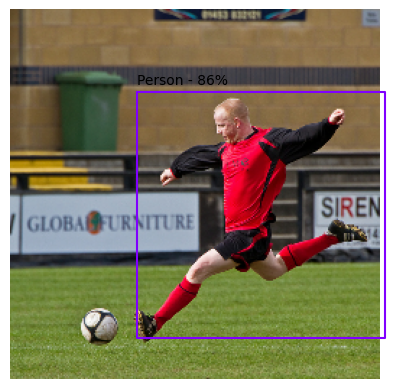

In [162]:
img_url = sample['img_url'].iloc[0]
y_true = sample['img_y'].iloc[0]
img = load_image_url(img_url, resize=resize)
pred_test = show_img(img , model, 0.4)

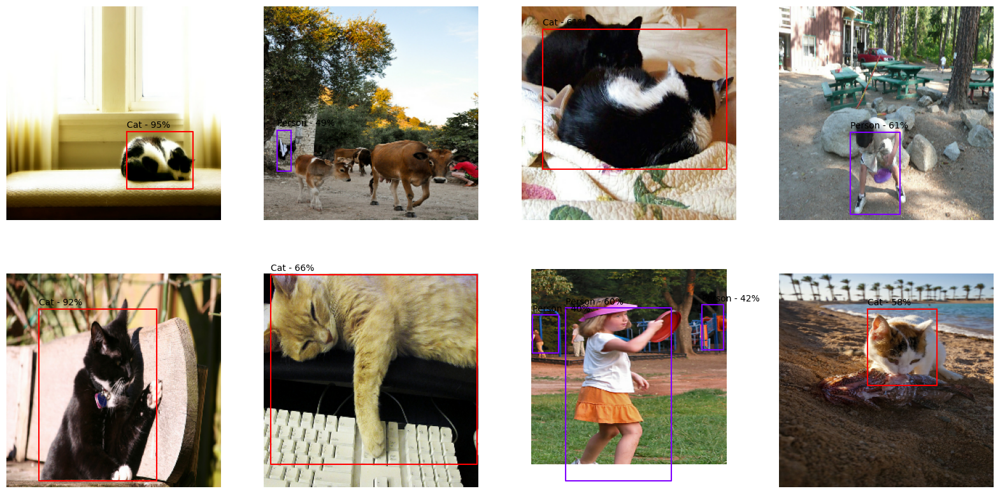

In [172]:
X_t, y_t = next(iter(dataset_test))
nbimg = 8
plt.figure(figsize=(20, 5*nbimg//4))
for j, i in zip(range(nbimg), np.random.randint(0, batch_size, [nbimg])):
    plt.subplot(nbimg//4,4,j+1)
    show_img(X_t[i], model, threshold=0.4)
    plt.xticks([])
    plt.yticks([])

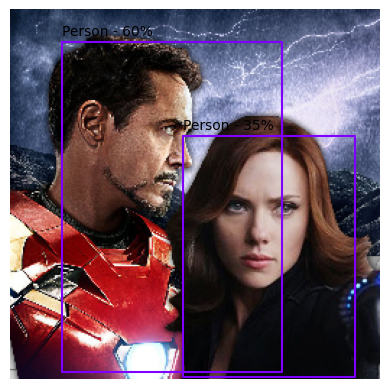

In [174]:
import time
import cv2, urllib, json

def show_img2(img, model, threshold=0.4):
    pred = model(np.array([img], dtype=np.float32))[0]
    pred = nms(transform_netout(pred))
    
    show_bounding_box(img, pred, detection_limit=threshold)
    
def url_to_image(url):
    resp = urllib.request.urlopen(url) 
    img = np.asarray(bytearray(resp.read()), dtype="uint8")
    img = cv2.imdecode(img, -1)
    img = cv2.resize(img, (256,256))
    img = img[..., [2,1,0]]
    return img

# Exemple
img = url_to_image("https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/iron-man-black-widow-marvel-1569327823.jpg")
show_img2(img, model, 0.3)